Start loading raw data.
Finish loading raw data.
Start filtering low-quality cells and SNPs.


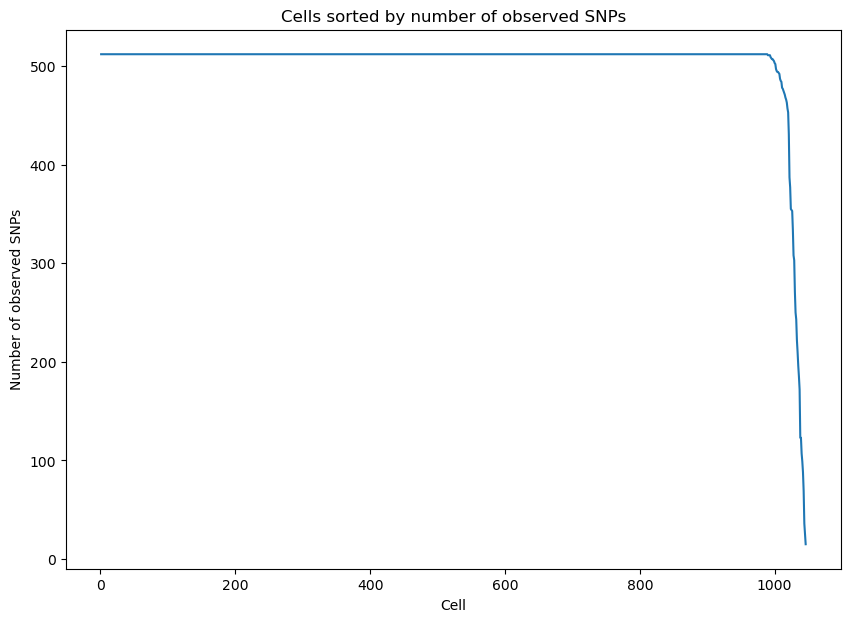

Please determine y-axis threshold in the plot to filter low-quality cells with low number of observed SNPs.   500


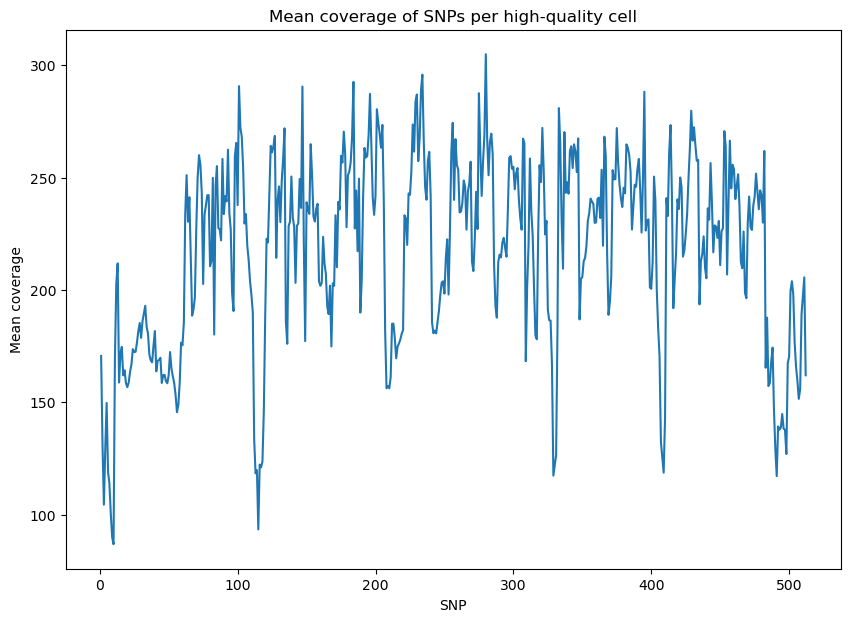

Please determine y-axis threshold in the plot to filter low-quality SNPs with low coverage.   0


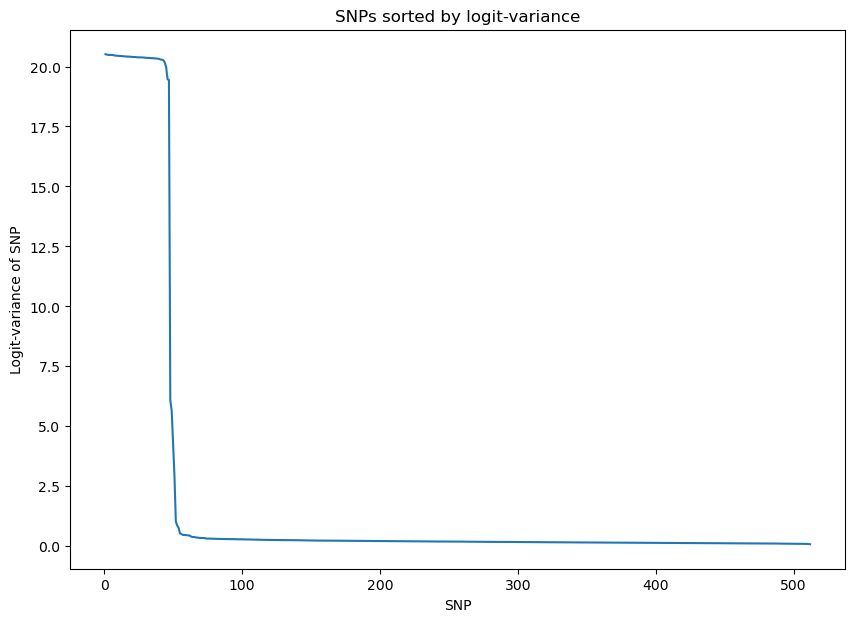

Please determine y-axis threshold in the plot to filter low-quality SNPs with low logit-variance.   0.5
Finish filtering low-quality data, 1001 cells and 56 SNPs will be used for downstream analysis.
Start training VAE.
Epoch[10/2000], Cost: 177.230103
Epoch[20/2000], Cost: 135.160126
Epoch[30/2000], Cost: 102.891136
Epoch[40/2000], Cost: 75.480911
Epoch[50/2000], Cost: 53.473602
Epoch[60/2000], Cost: 37.747818
Epoch[70/2000], Cost: 28.251751
Epoch[80/2000], Cost: 23.108932
Epoch[90/2000], Cost: 20.346066
Epoch[100/2000], Cost: 18.652277
Epoch[110/2000], Cost: 17.495783
Epoch[120/2000], Cost: 16.657534
Epoch[130/2000], Cost: 16.095108
Epoch[140/2000], Cost: 15.460357
Epoch[150/2000], Cost: 15.195120
Epoch[160/2000], Cost: 14.881383
Epoch[170/2000], Cost: 14.741078
Epoch[180/2000], Cost: 14.464780
Epoch[190/2000], Cost: 14.299423
Epoch[200/2000], Cost: 14.213087
Epoch[210/2000], Cost: 14.103408
Epoch[220/2000], Cost: 14.022489
Epoch[230/2000], Cost: 13.957386
Epoch[240/2000], Cost: 13.8

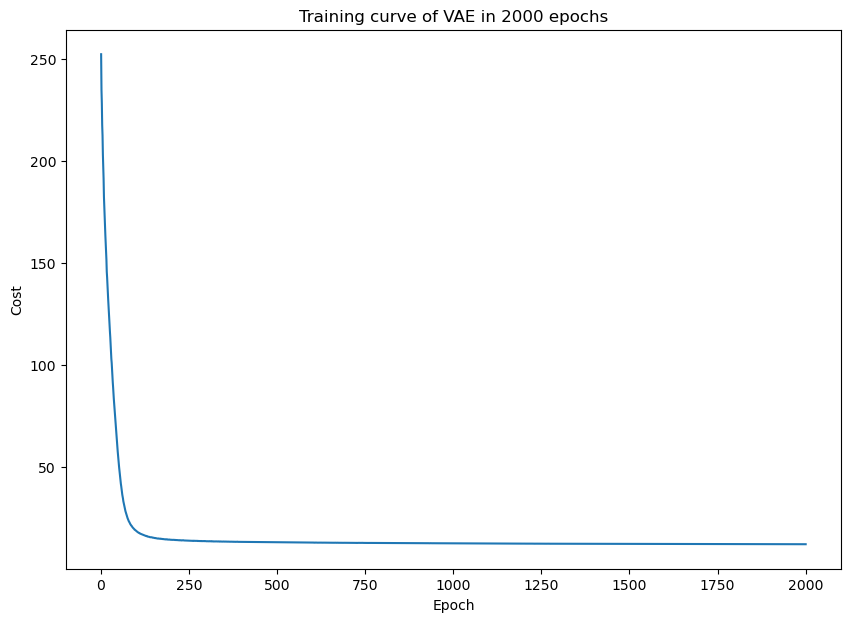

Start learning PCA and UMAP of latent space in VAE.
Finish learning, PCA and UMAP of latent space will be shown below.


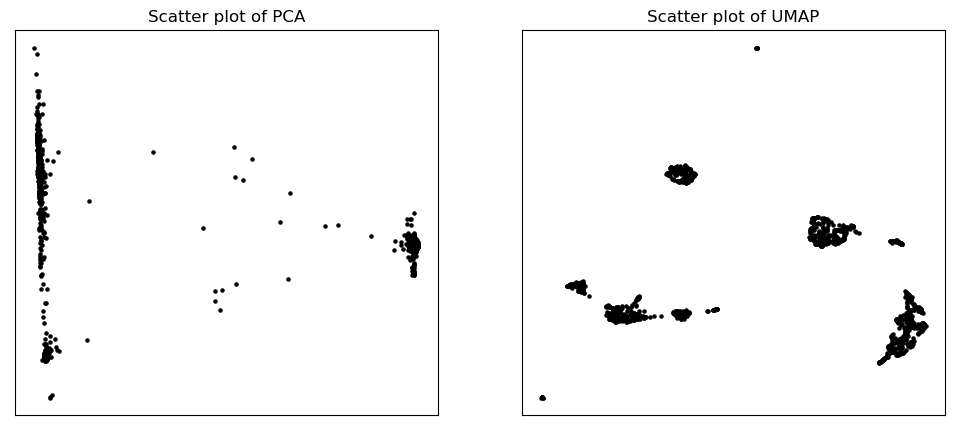

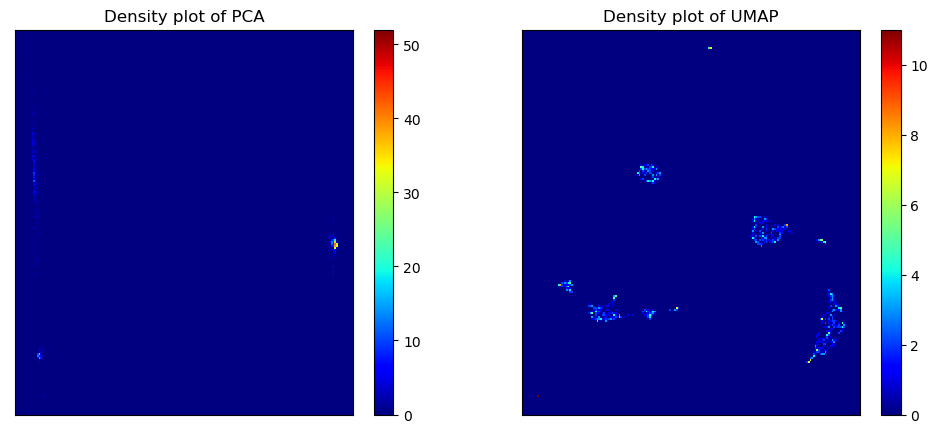

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


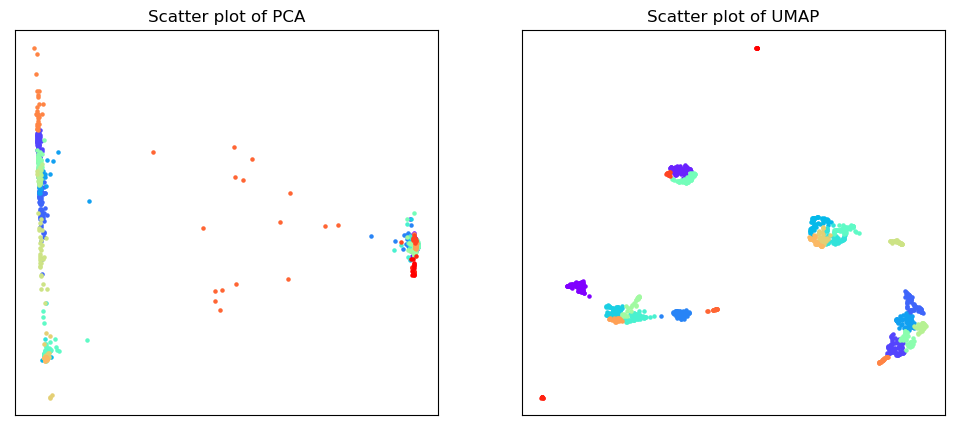

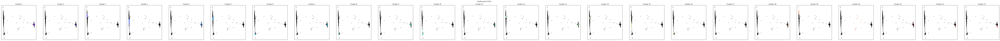

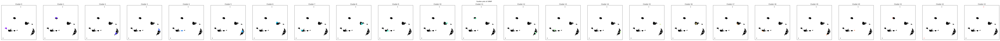

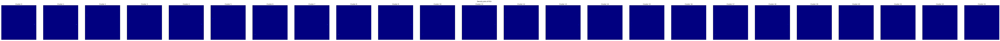

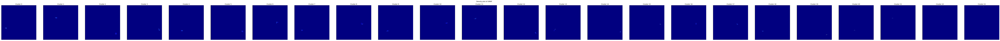

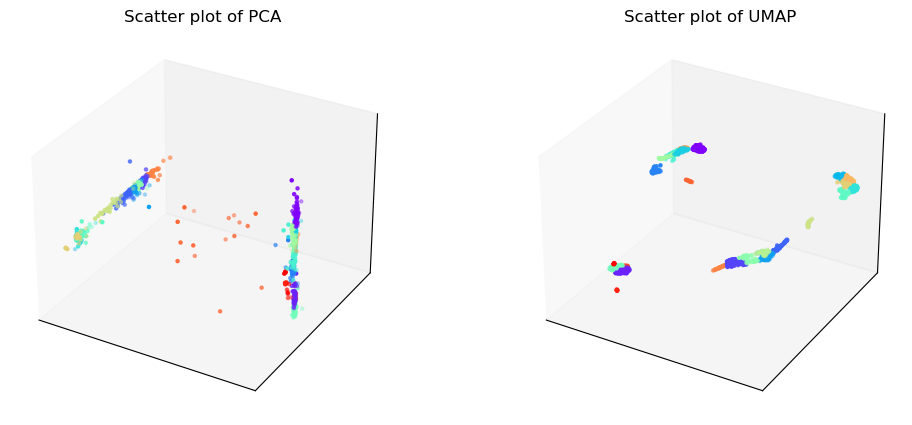

Phylogenetic tree in latent space will be shown below.


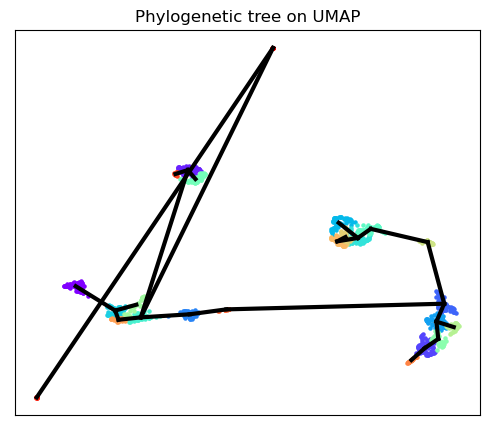

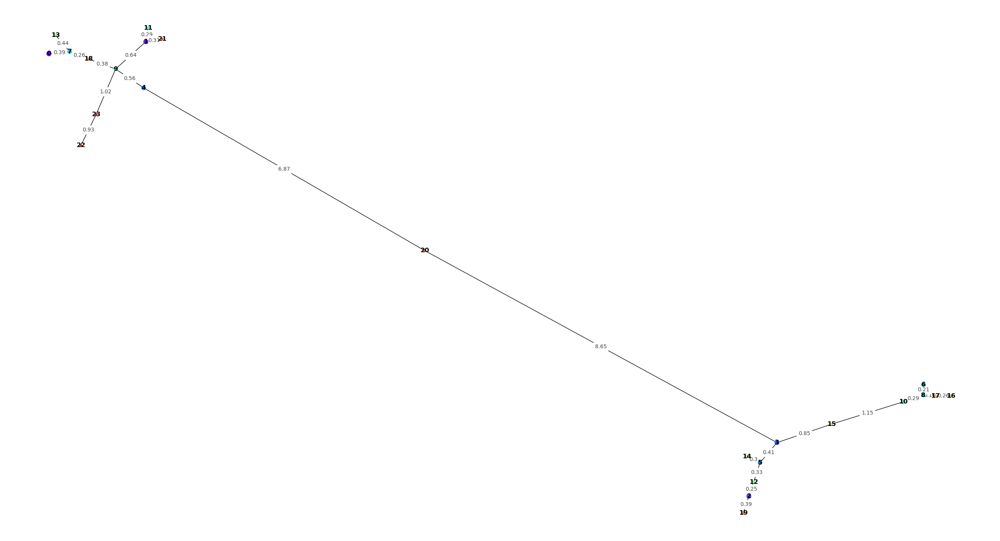

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:261: RuntimeWarning: divide by zero encountered in true_divide


SNP-allelic ratios of 1001 cells and 50 SNPs will be shown below.


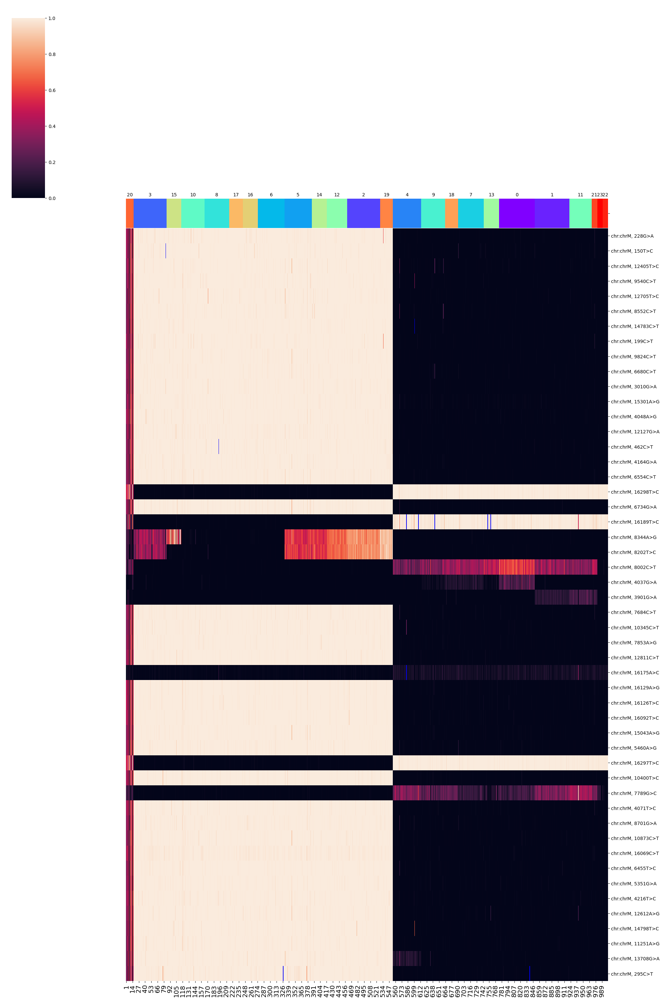

SNPs sorted by lowest p-value will be shown below


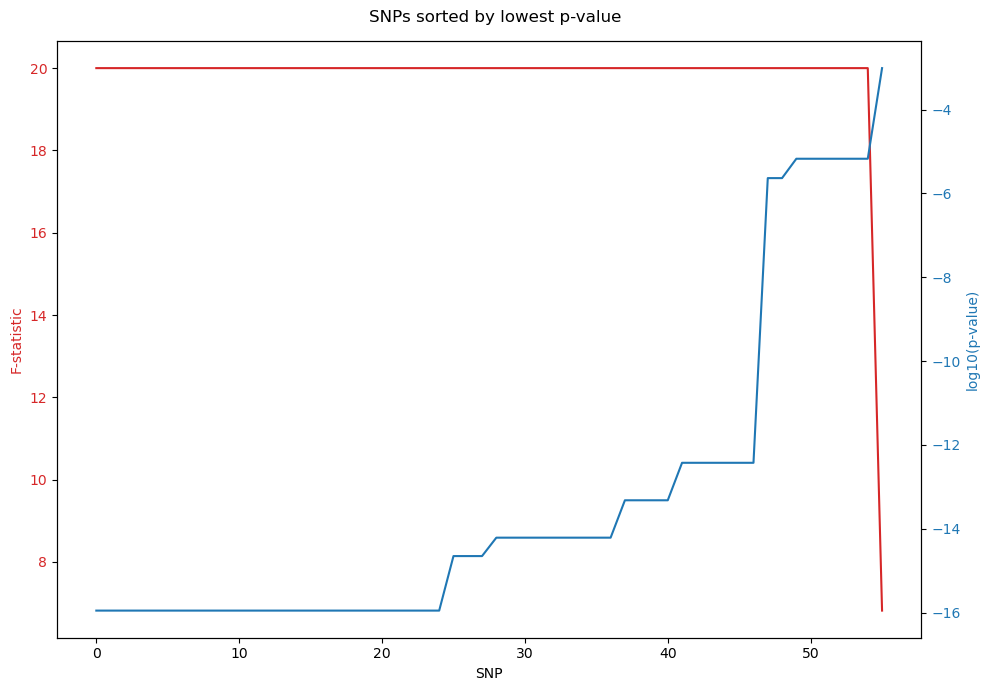

In [2]:
%run /home/u3570318/mount2/figures_final2/notebook2/SNPmanifold.ipynb
test1 = SNP_VAE("/home/u3570318/mount2/figures_final2/data/mtscATAC1")
test1.filtering()
test1.training()
test1.clustering(algorithm = "leiden_umap3d")
test1.phylogeny()

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


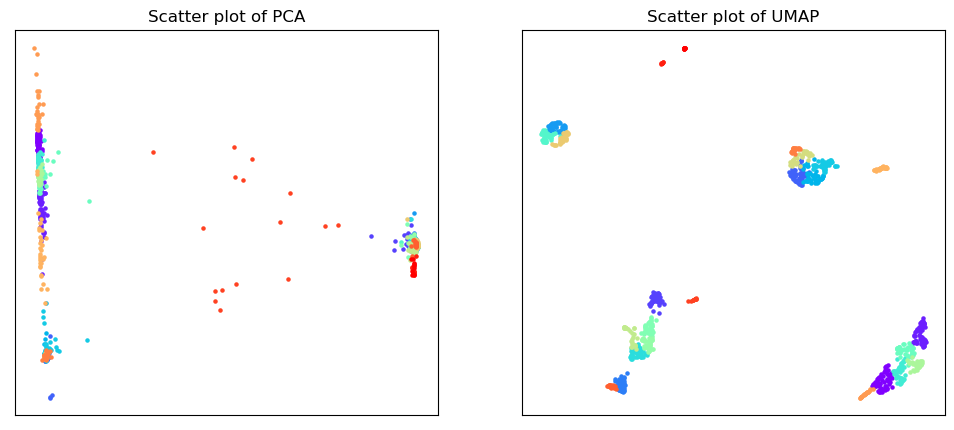

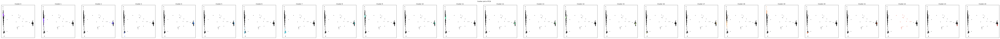

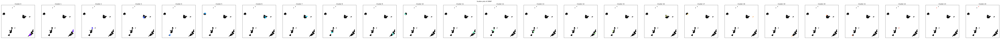

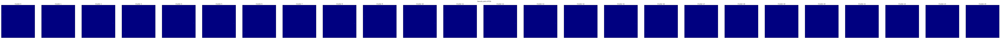

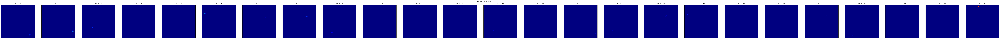

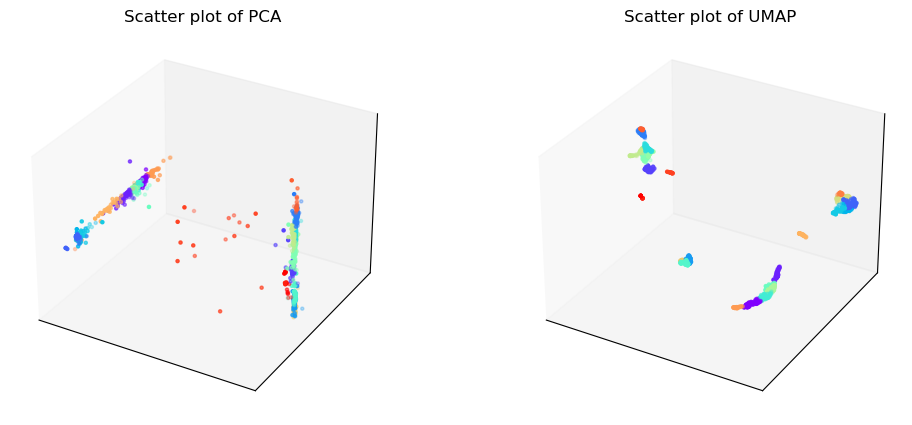

Phylogenetic tree in latent space will be shown below.


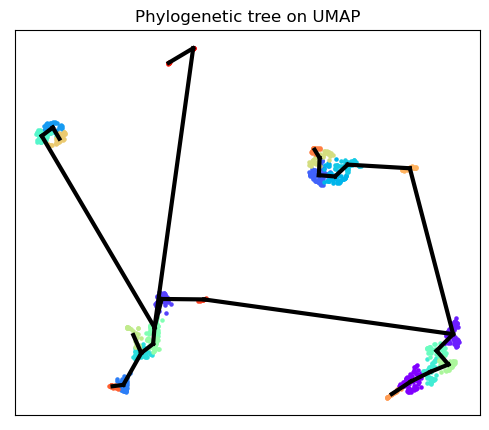

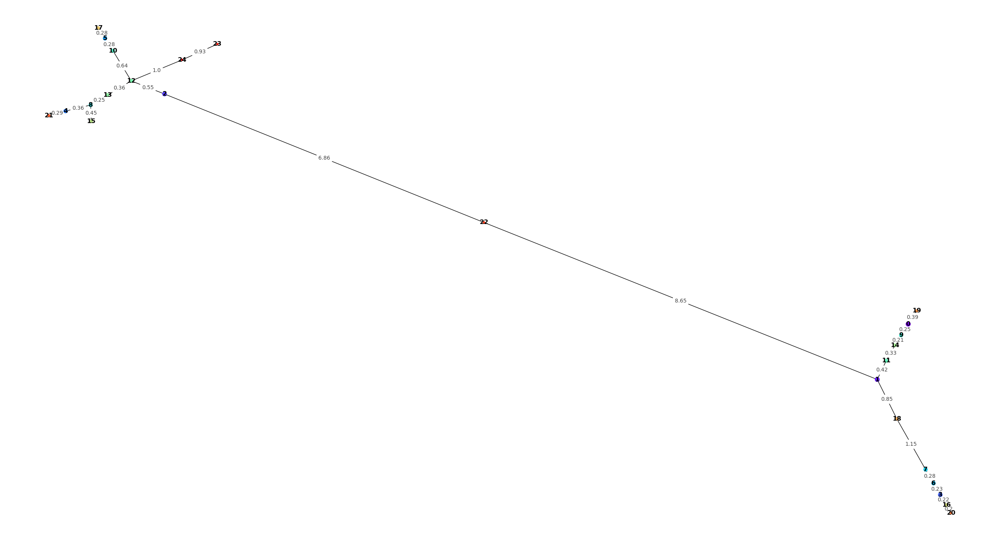

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:261: RuntimeWarning: divide by zero encountered in true_divide


SNP-allelic ratios of 1001 cells and 50 SNPs will be shown below.


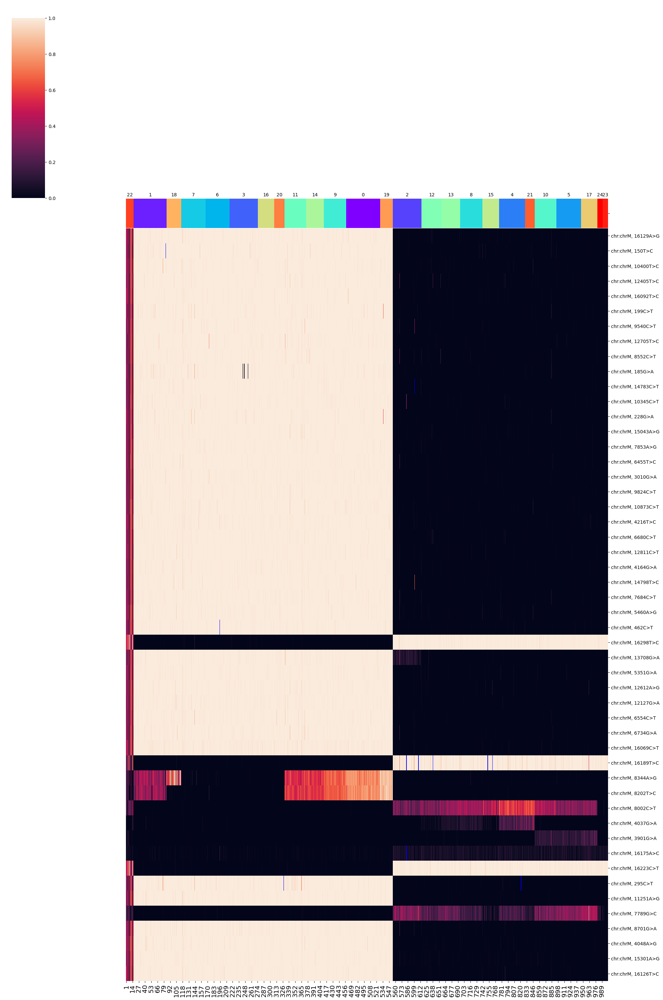

SNPs sorted by lowest p-value will be shown below


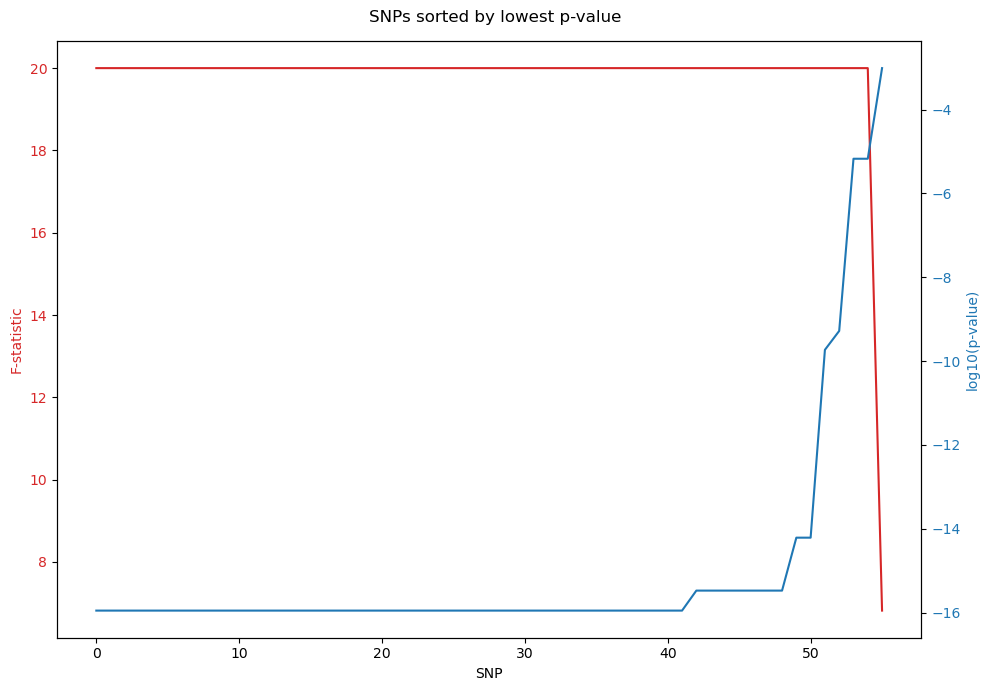

In [17]:
test1.clustering(algorithm = "leiden_umap3d")
test1.phylogeny()

Finish filtering low-quality data, 1001 cells and 56 SNPs will be used for downstream analysis.


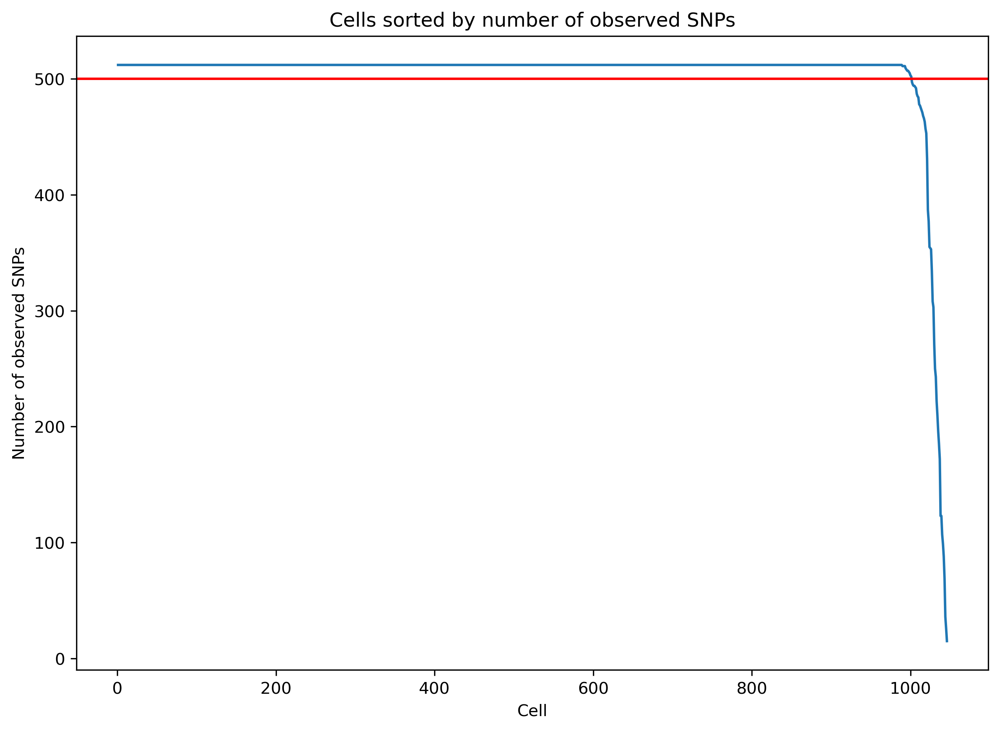

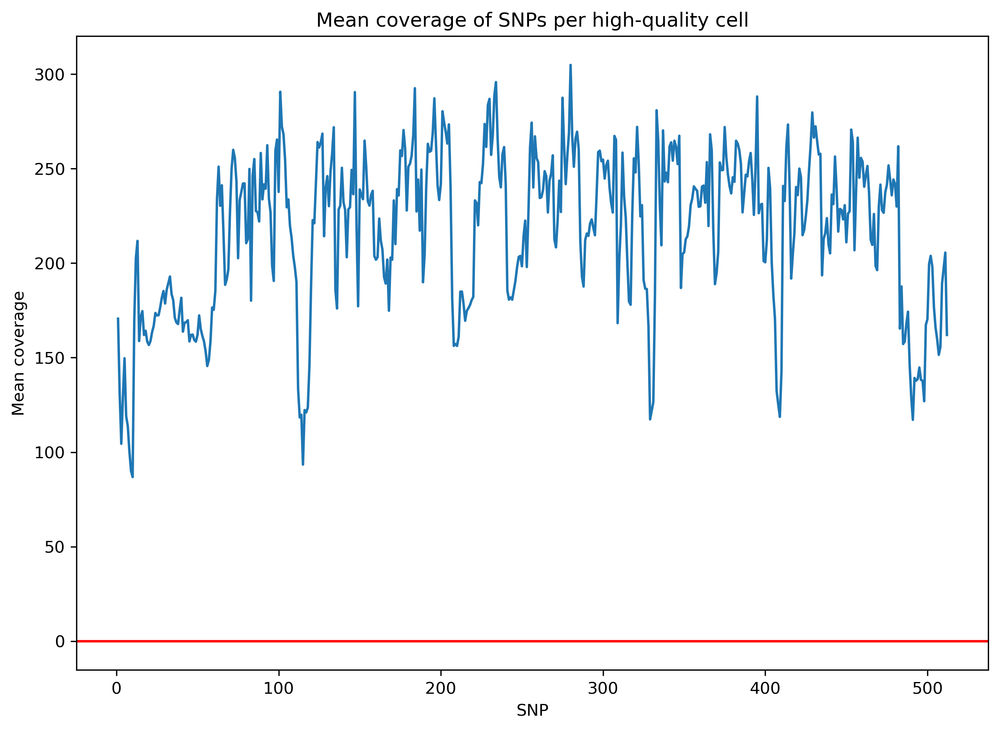

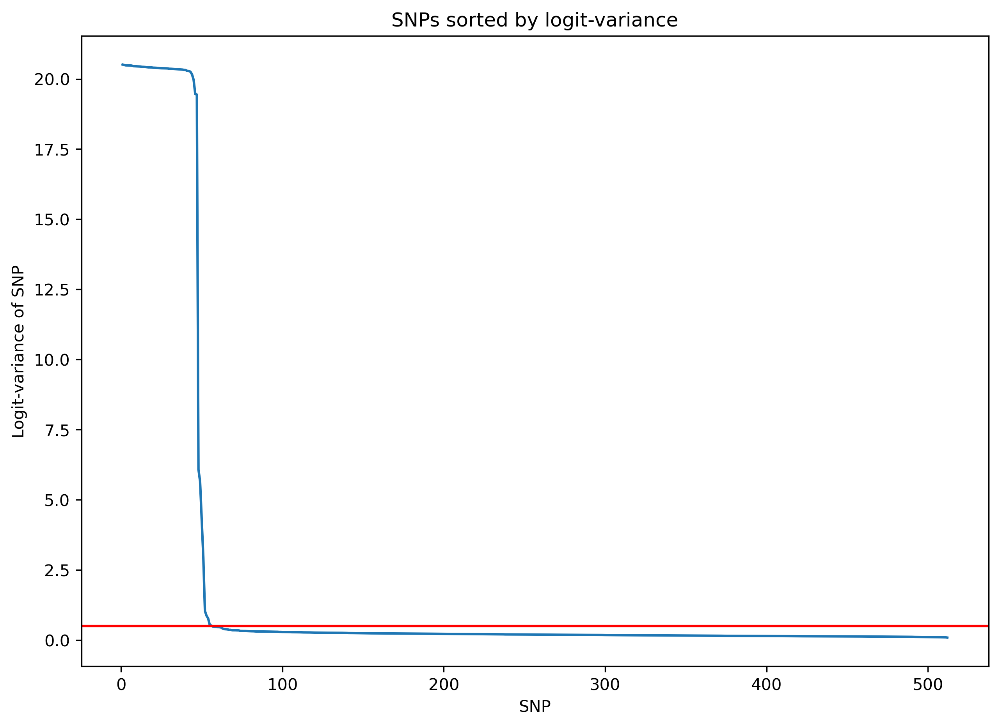

Training curve will be shown below.


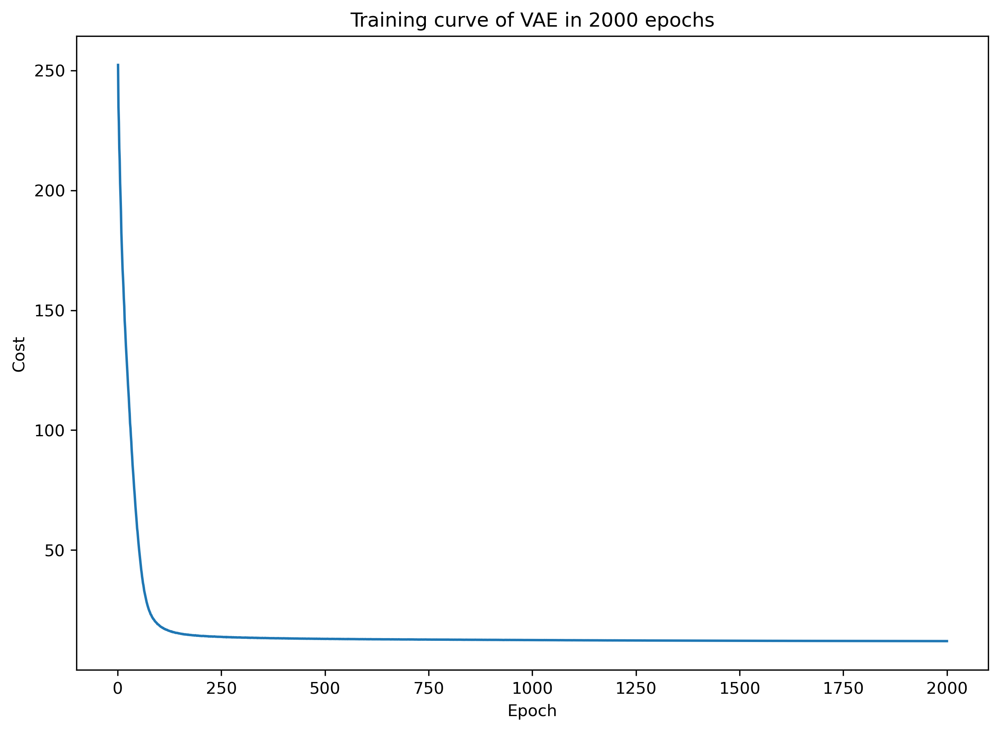

PCA and UMAP of latent space will be shown below.


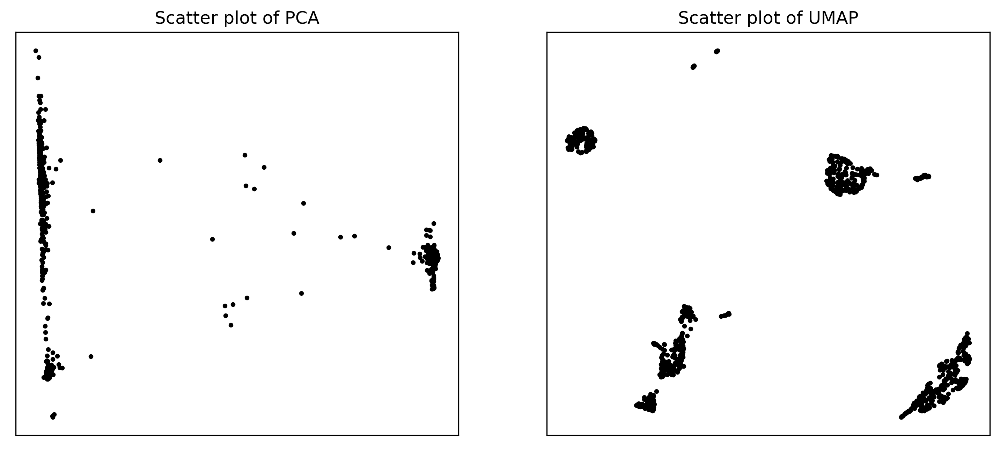

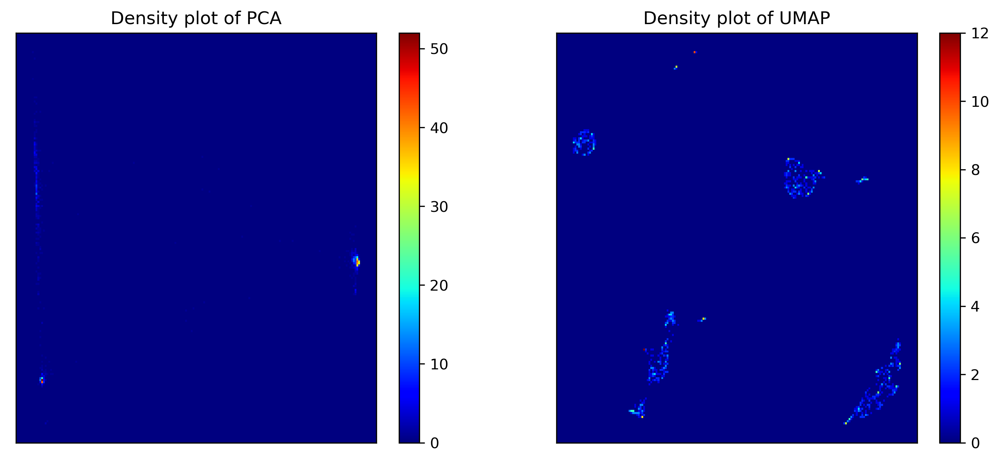

Nothing to be shown.
PCA and UMAP of individual clusters will be shown below.


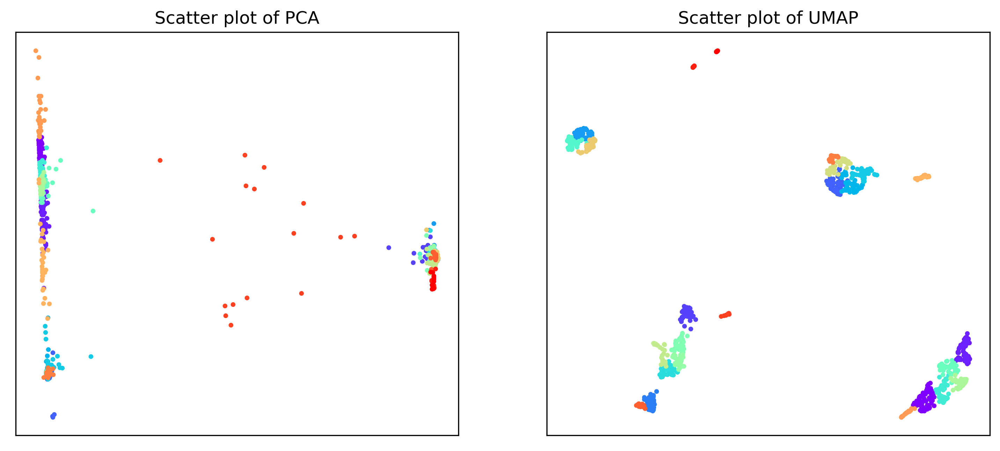

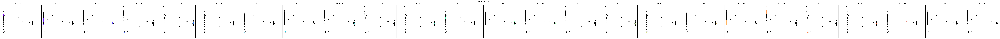

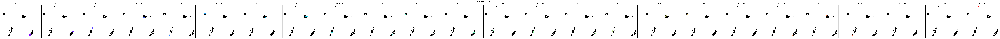

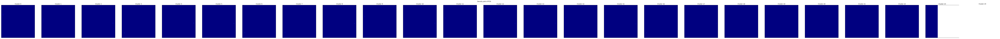

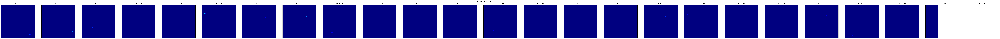

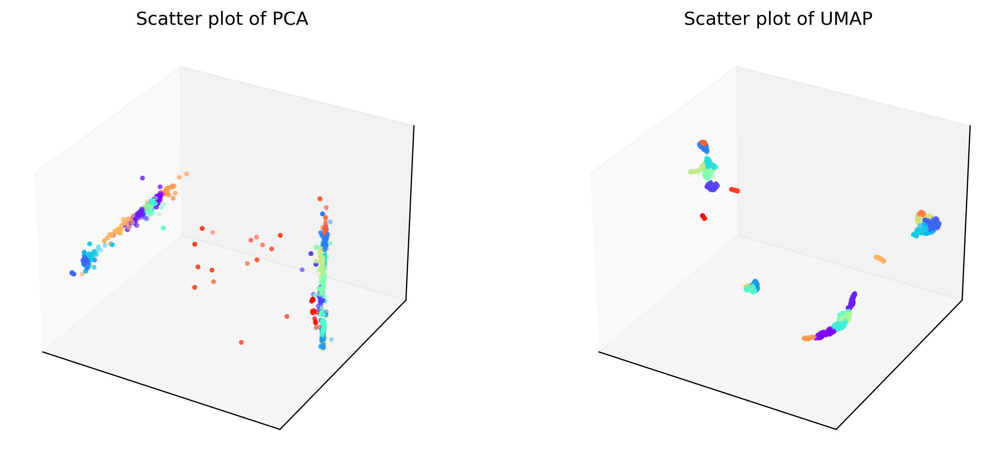

Phylogenetic tree in latent space will be shown below.


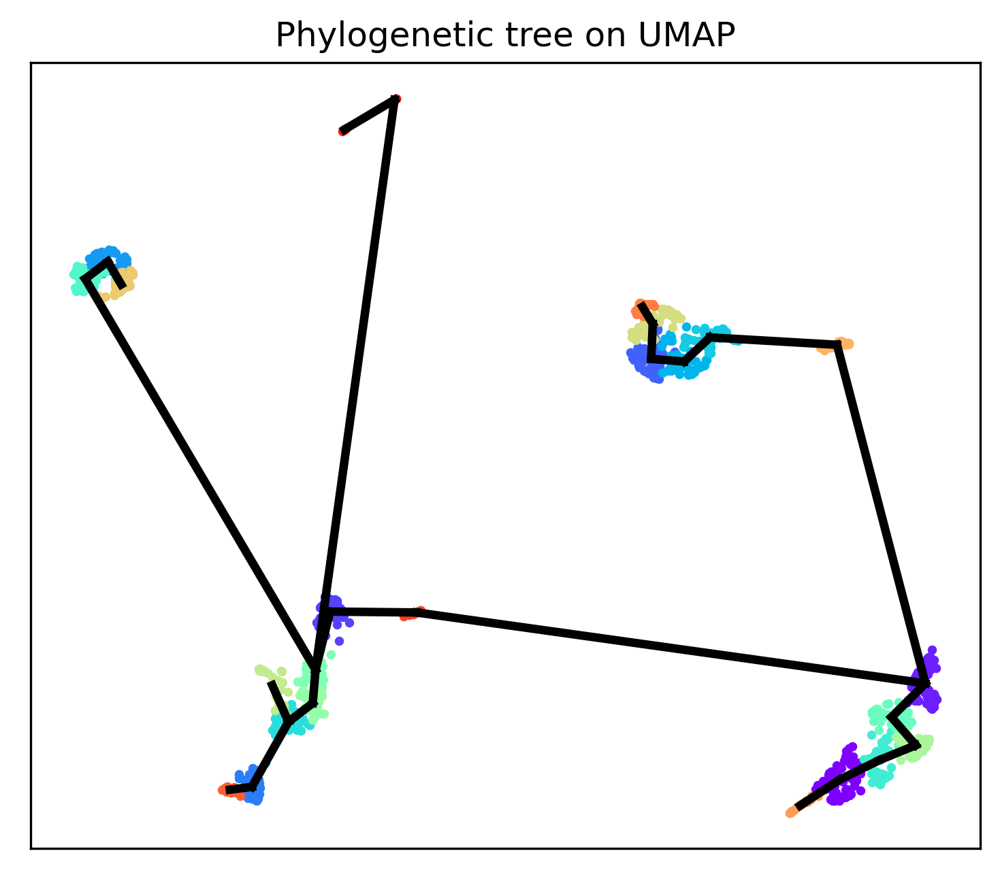

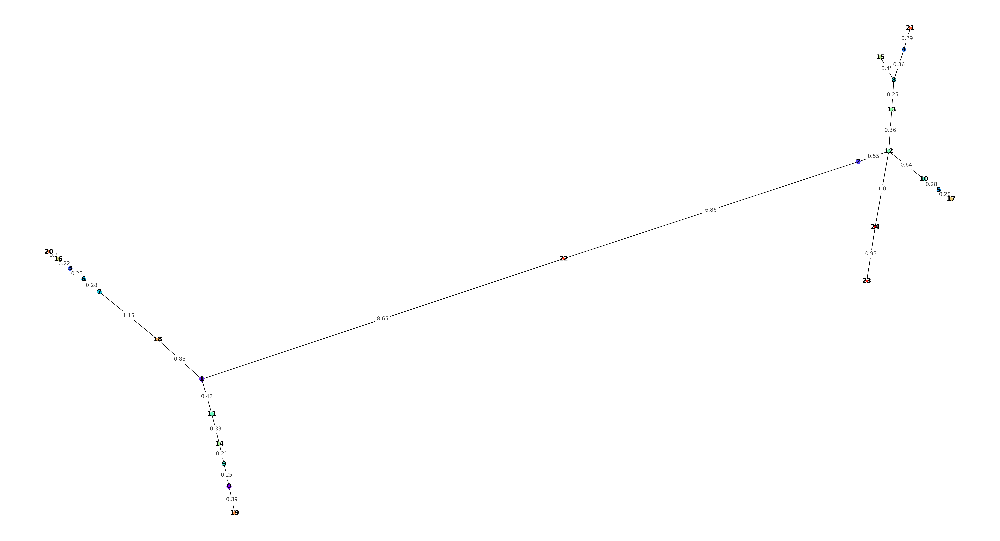

SNP-allelic ratios of 1001 cells and 54 SNPs will be shown below.


SNPs sorted by lowest p-value will be shown below


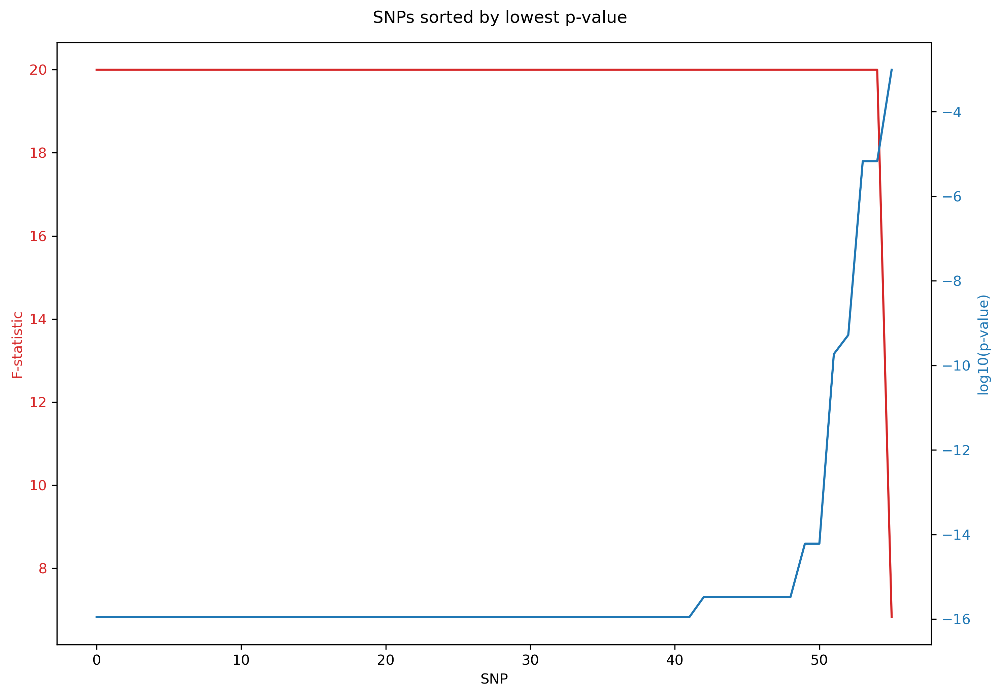

In [19]:
test1.filtering_summary(dpi = 300)
test1.training_summary(dpi = 300)
test1.clustering_summary(dpi = 300)
test1.phylogeny_summary(dpi = 300, SNP_no = 54, fontsize_y = 14, fontsize_x = 12, fontsize_c = 15)

Finish filtering low-quality data, 1001 cells and 56 SNPs will be used for downstream analysis.


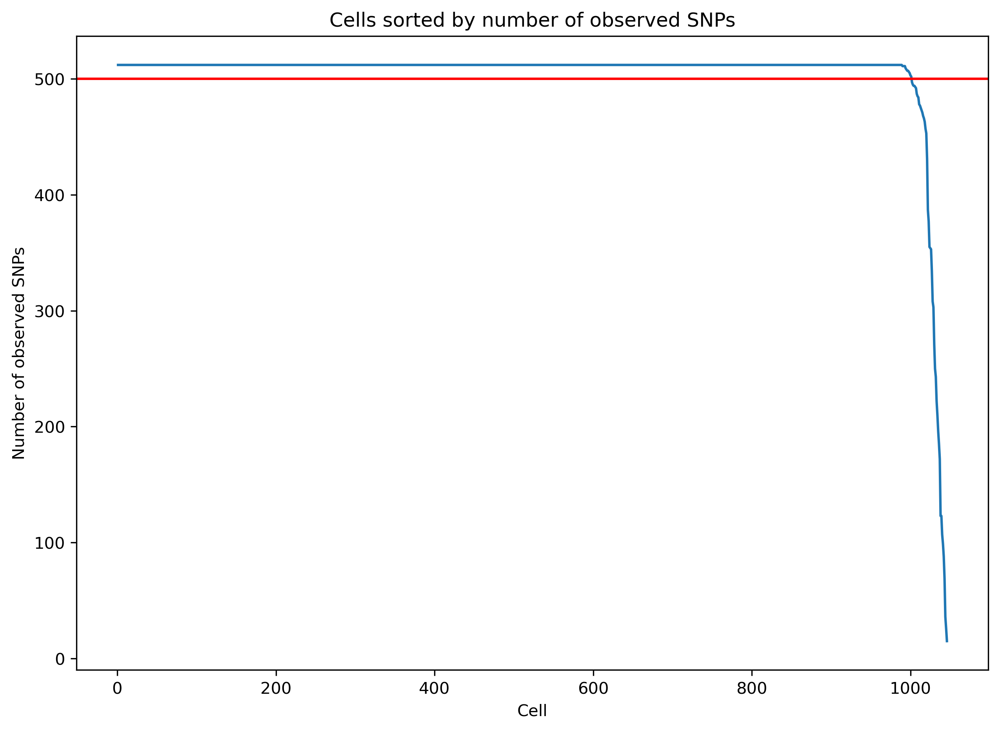

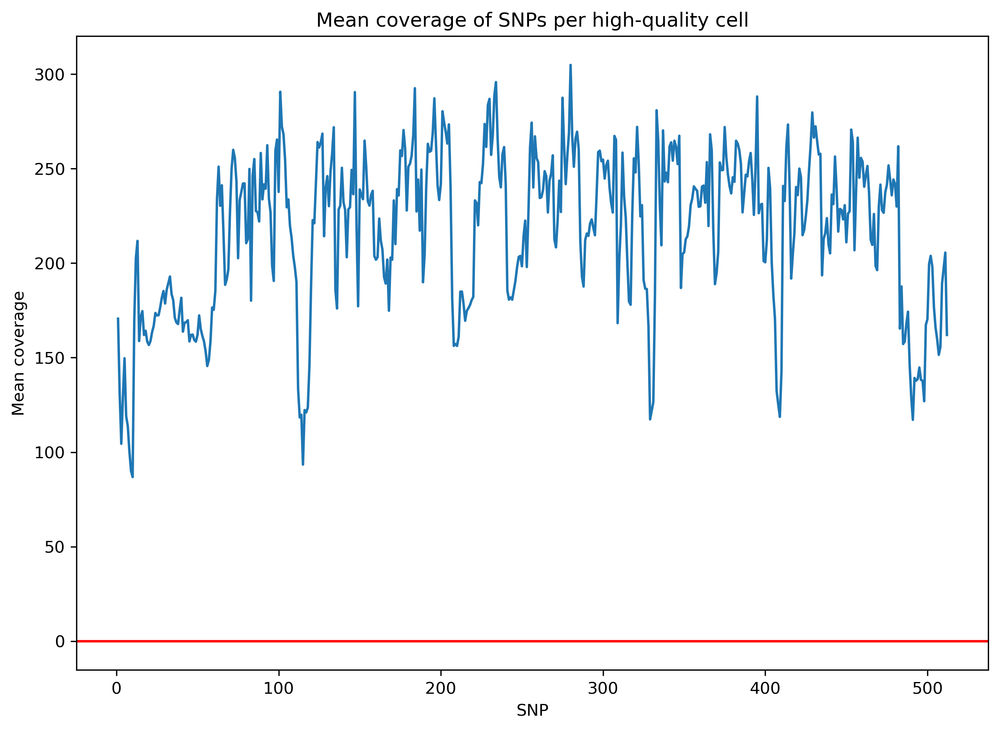

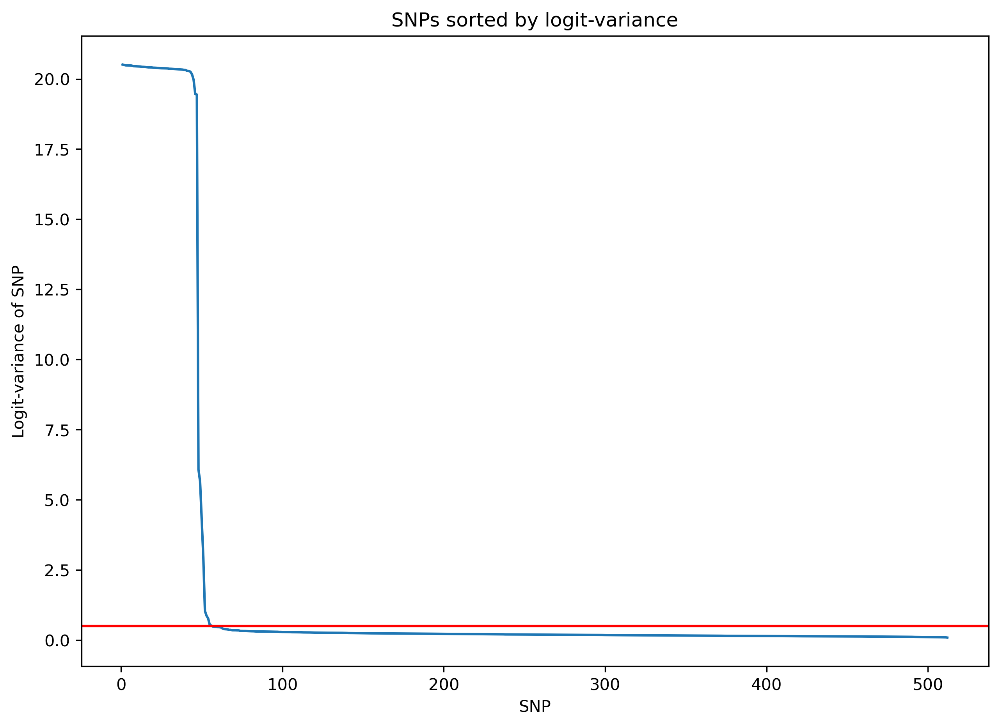

Training curve will be shown below.


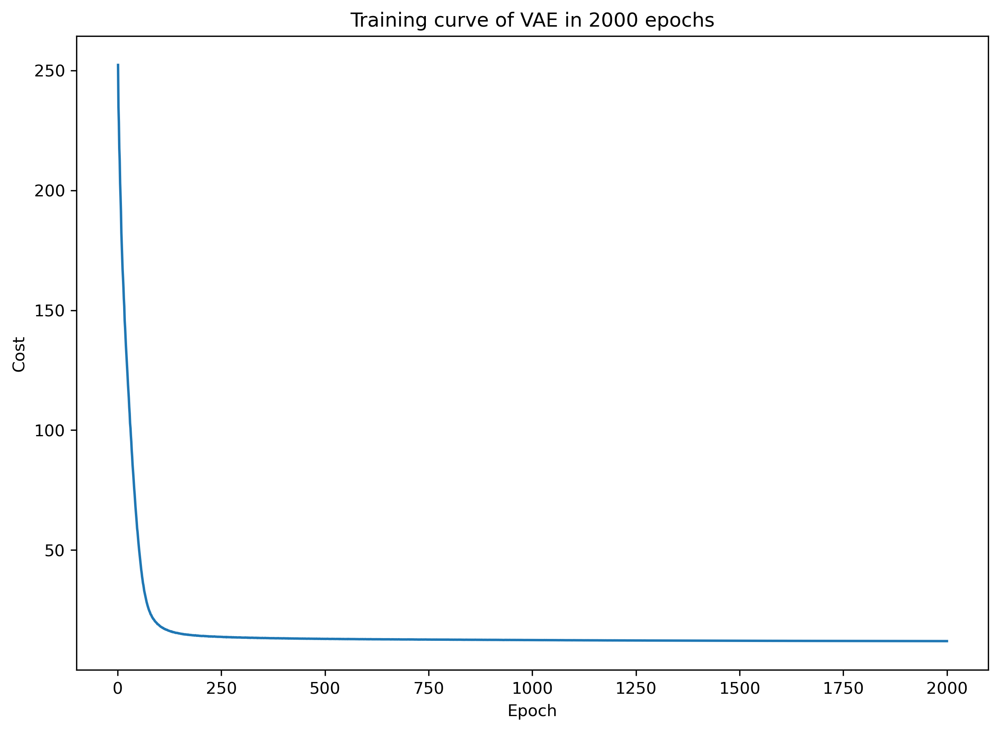

PCA and UMAP of latent space will be shown below.


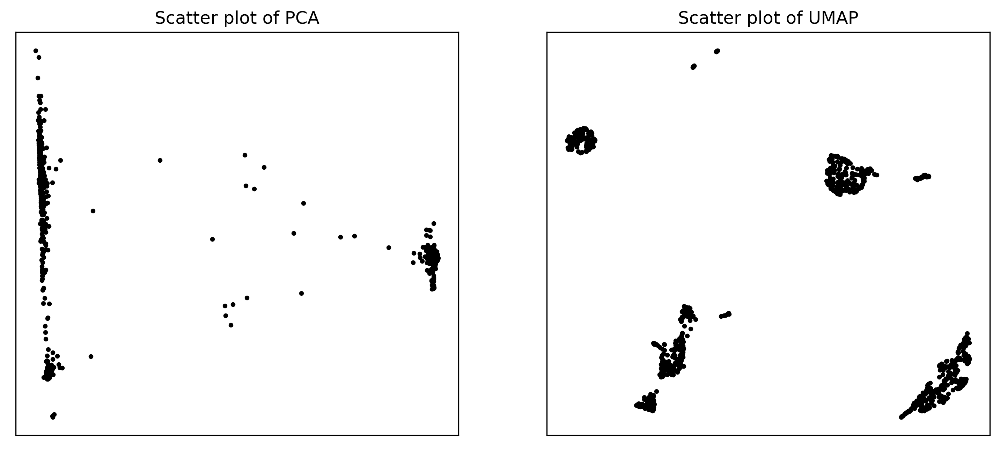

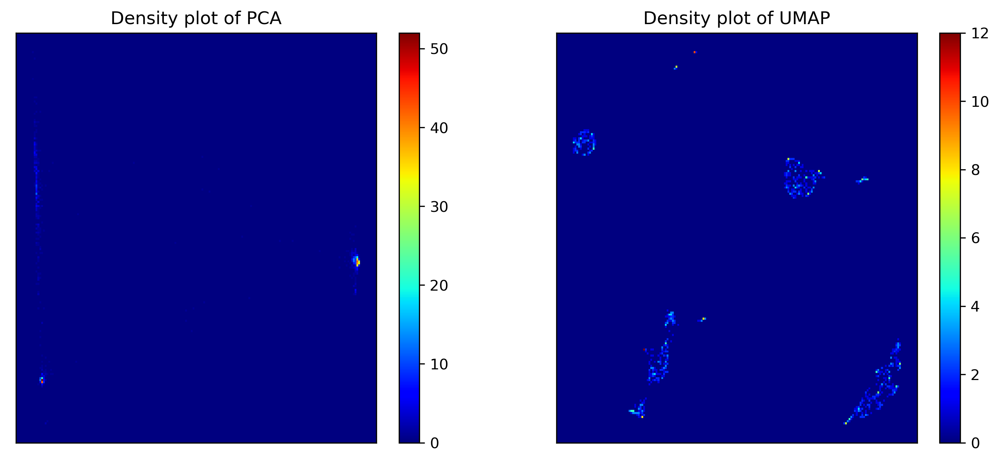

Nothing to be shown.
PCA and UMAP of individual clusters will be shown below.


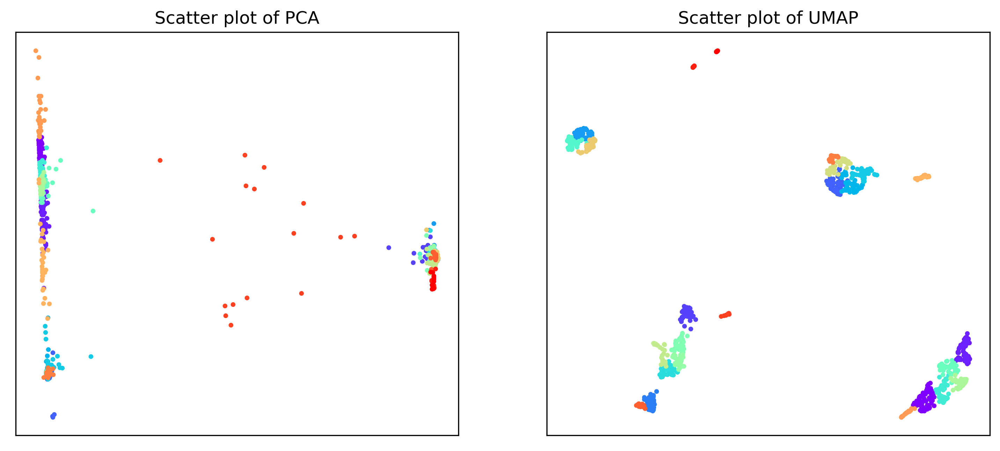

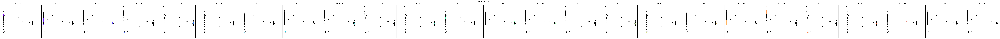

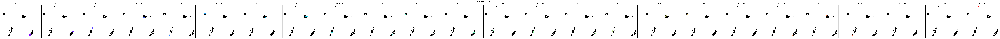

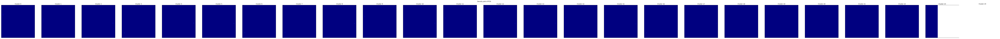

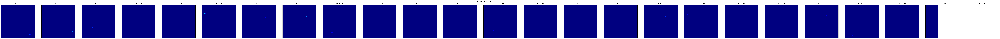

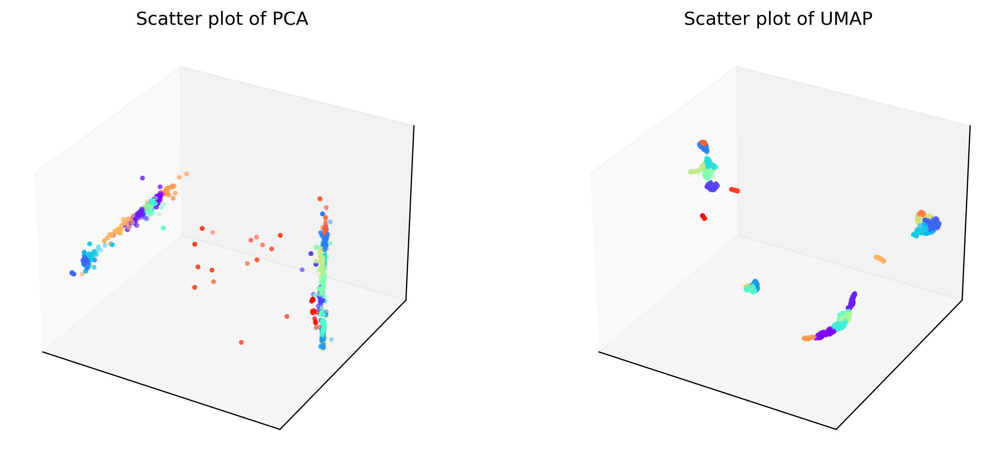

Phylogenetic tree in latent space will be shown below.


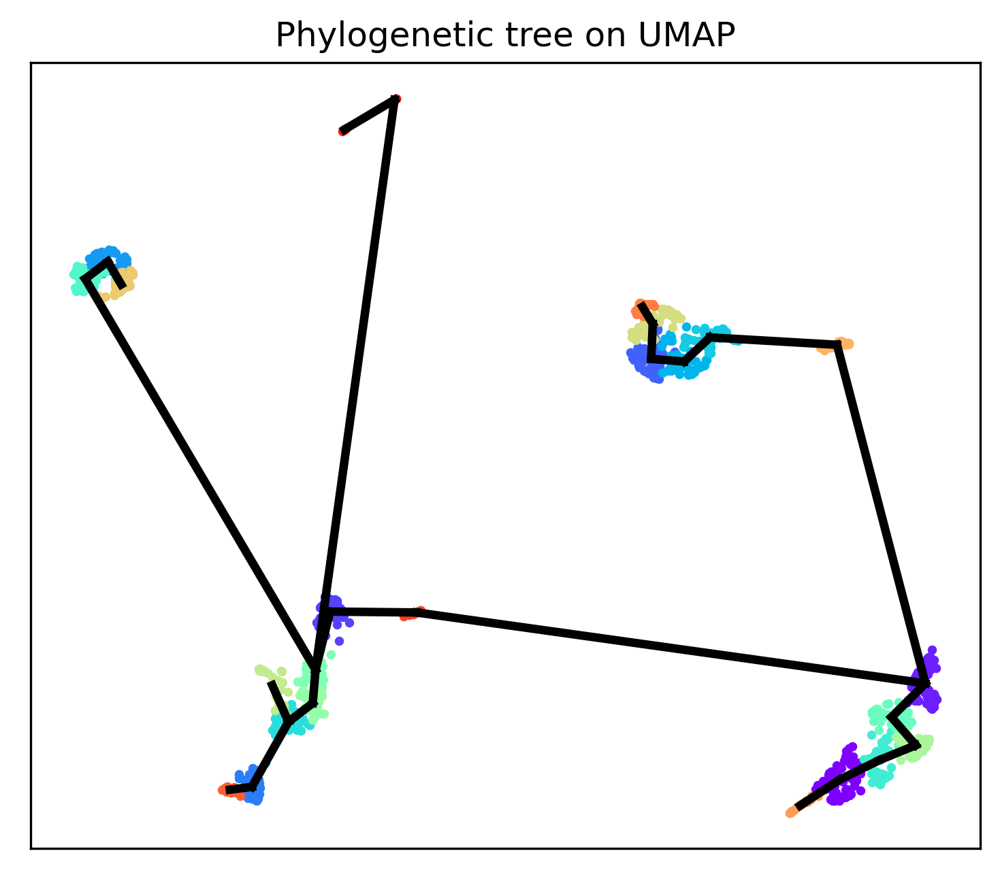

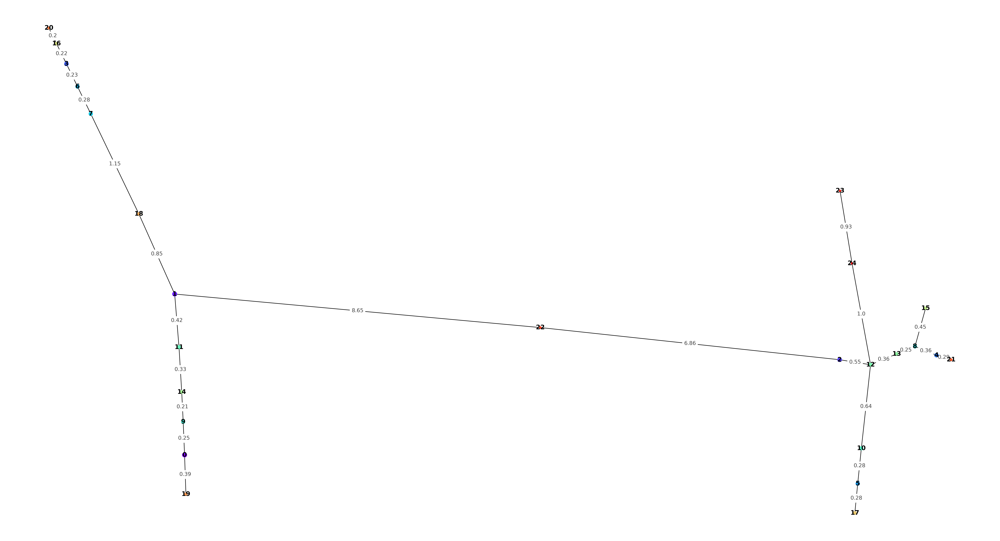

SNP-allelic ratios of 1001 cells and 56 SNPs will be shown below.


SNPs sorted by lowest p-value will be shown below


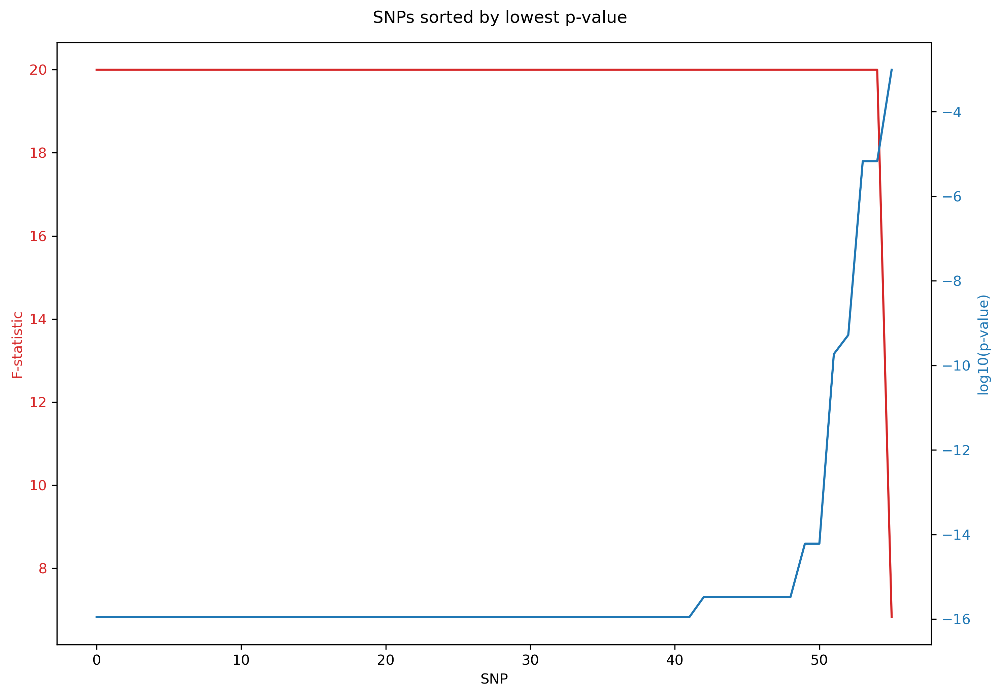

In [83]:
test1.filtering_summary(dpi = 300)
test1.training_summary(dpi = 300)
test1.clustering_summary(dpi = 300)
test1.phylogeny_summary(dpi = 300, SNP_no = 56, fontsize_y = 14, fontsize_x = 12, fontsize_c = 15)

In [85]:
dpi = 300
SNP_no = 55
fontsize_y = 14
fontsize_x = 12
fontsize_c = 15

print(f"SNP-allelic ratios of {test1.cell_total} cells and {SNP_no} SNPs will be shown below.")

order_SNP = [50, 42, 35, 27, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 29, 30, 31, 32, 33, 34, 43, 44, 46, 47, 48, 49, 51, 52, 54, 28, 41, 38, 45, 39, 40, 53, 36, 37]
    
clus_colors = pd.Series(test1.assigned_label[test1.cell_sorted]).map(dict(zip(np.arange(0, test1.cluster_no), test1.colors)))
clus_colors.index = pd.RangeIndex(start = 1, stop = test1.cell_total + 1, step = 1)

cmap = mpl.colormaps['rocket'] 
cmap.set_bad("blue")

if test1.is_VCF == True:

    fig = sns.clustermap(pd.DataFrame(test1.AF_sorted[:SNP_no, :][order_SNP, :], index = test1.VCF_filtered["TEXT"].to_numpy()[test1.rank_SNP][:SNP_no][order_SNP], columns = np.arange(1, test1.cell_total + 1)), row_cluster = False, col_cluster = False, col_colors = clus_colors, figsize = (20, SNP_no * 0.6), cmap = cmap, vmin = 0, vmax = 1)

elif test1.is_VCF == False:

    fig = sns.clustermap(pd.DataFrame(test1.AF_sorted[:SNP_no, :][order_SNP, :], index = test1.VCF_filtered[0].to_numpy()[test1.rank_SNP][:SNP_no][order_SNP], columns = np.arange(1, test1.cell_total + 1)), row_cluster = False, col_cluster = False, col_colors = clus_colors, figsize = (20, SNP_no * 0.6), cmap = cmap, vmin = 0, vmax = 1)

fig.ax_col_colors.set_xticks(moving_average(np.cumsum([0] + list(test1.cluster_size[test1.cluster_order])), 2))

if fontsize_c == None:

    fig.ax_col_colors.set_xticklabels(np.array(test1.cluster_order))

elif fontsize_c != None:

    fig.ax_col_colors.set_xticklabels(np.array(test1.cluster_order), fontsize = fontsize_c)

fig.ax_col_colors.xaxis.set_tick_params(size = 0)
fig.ax_col_colors.xaxis.tick_top()

if fontsize_x != None:

    fig.ax_heatmap.set_xticklabels(fig.ax_heatmap.get_xmajorticklabels(), fontsize = fontsize_x)

if fontsize_y != None:

    fig.ax_heatmap.set_yticklabels(fig.ax_heatmap.get_ymajorticklabels(), fontsize = fontsize_y)

plt.gcf().set_dpi(dpi)
plt.show()

SNP-allelic ratios of 1001 cells and 55 SNPs will be shown below.


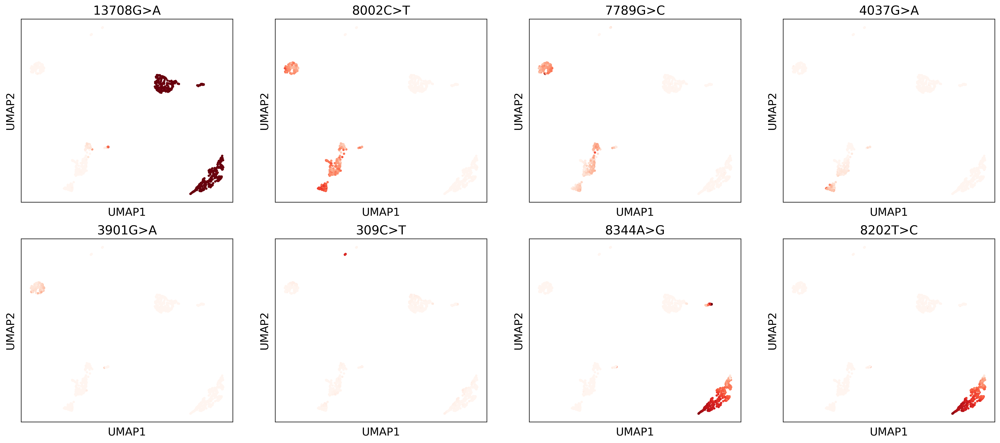

In [96]:
AF_sorted_missing_to_zero = np.copy(test1.AF_sorted)
AF_sorted_missing_to_zero[np.isnan(test1.AF_sorted)] = 0

color_AF = cm.Reds(np.linspace(0, 1, 101))
embedding_2d_sorted = test1.embedding_2d[test1.cell_sorted, :]

fig, axs = plt.subplots(2, 4, dpi = 300)
fig.set_size_inches(24, 10)

for t in range(4):
    
    position1 = [-9, -7, -6, -5][t]
    position2 = [-4, -3 , -2, -1][t]
    title1 = ["13708G>A", "8002C>T", "7789G>C", "4037G>A"][t]
    title2 = ["3901G>A", "309C>T", "8344A>G", "8202T>C"][t]
  
    AF_density = np.round(AF_sorted_missing_to_zero[:SNP_no, :][order_SNP, :][position1, :] * 100).astype(int)

    axs[0, t].set_title(title1, fontsize = 17)

    for j in range(test1.cell_total):

        axs[0, t].scatter(embedding_2d_sorted[j, 0], embedding_2d_sorted[j, 1], s = 5, color = color_AF[AF_density[j]])

    axs[0, t].set_xticks([])
    axs[0, t].set_yticks([])
    axs[0, t].set_xlabel("UMAP1", fontsize = 15)
    axs[0, t].set_ylabel("UMAP2", fontsize = 15)

    AF_density = np.round(AF_sorted_missing_to_zero[:SNP_no, :][order_SNP, :][position2, :] * 100).astype(int)

    axs[1, t].set_title(title2, fontsize = 17)

    for j in range(test1.cell_total):

        axs[1, t].scatter(embedding_2d_sorted[j, 0], embedding_2d_sorted[j, 1], s = 5, color = color_AF[AF_density[j]])

    axs[1, t].set_xticks([])
    axs[1, t].set_yticks([])
    axs[1, t].set_xlabel("UMAP1", fontsize = 15)
    axs[1, t].set_ylabel("UMAP2", fontsize = 15)

plt.show()

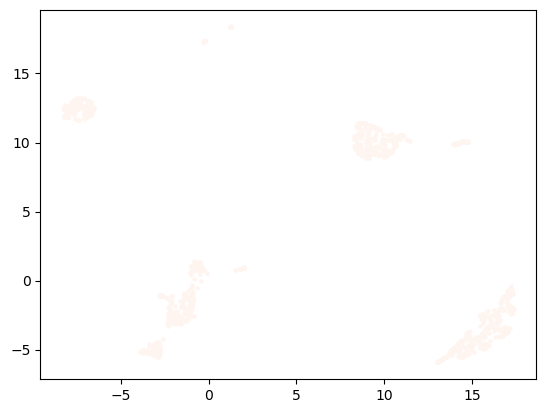

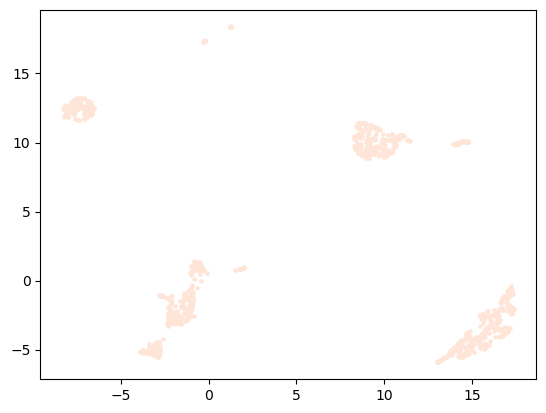

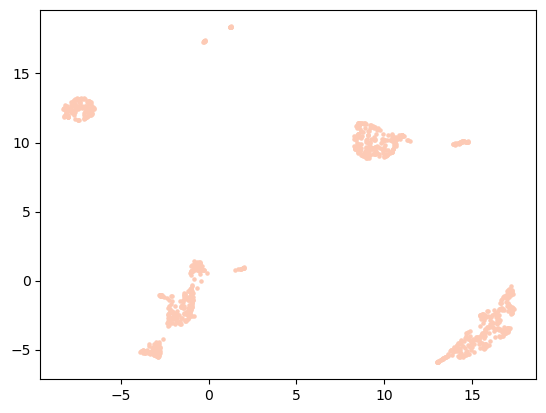

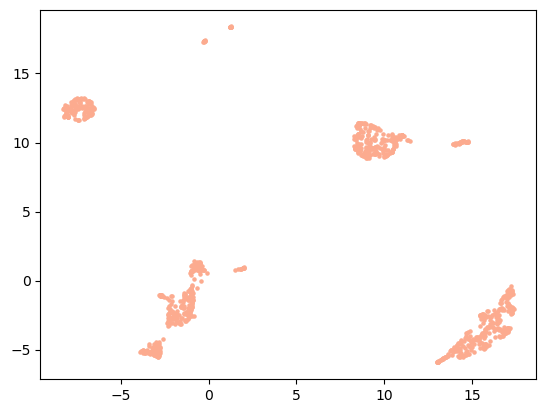

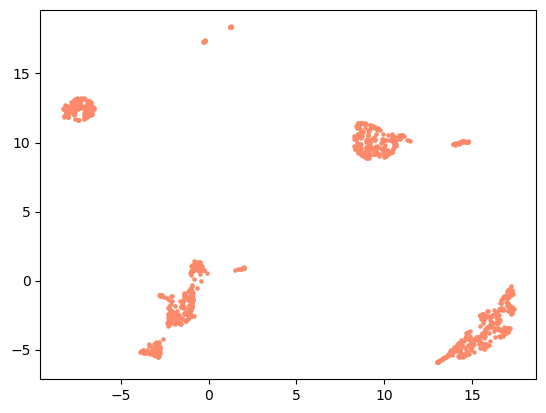

...

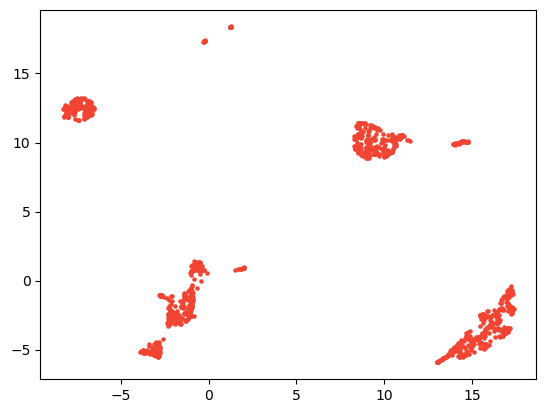

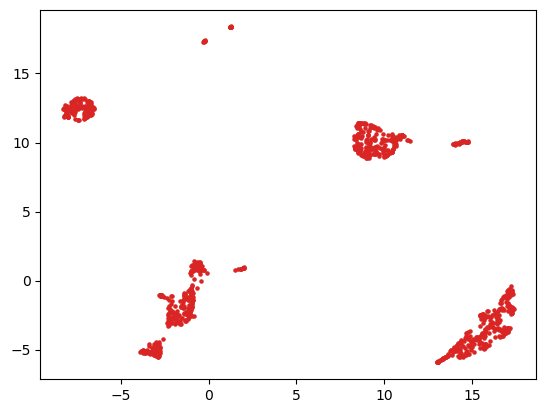

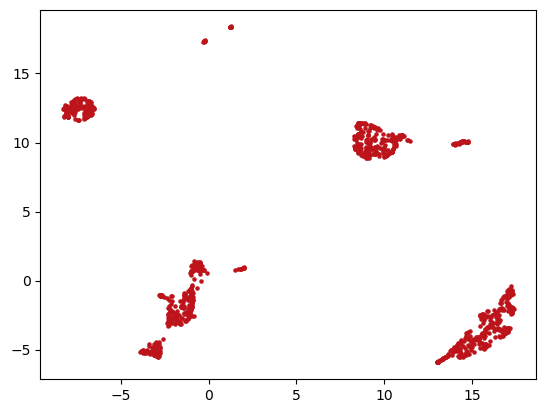

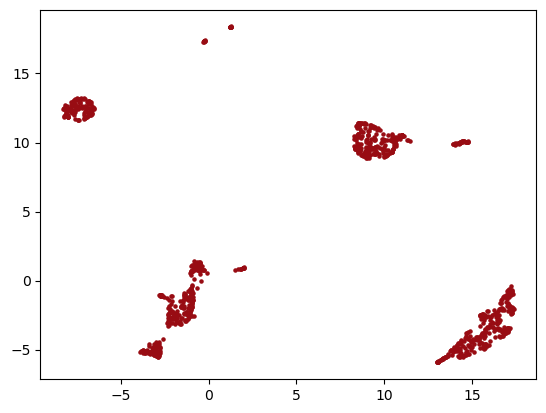

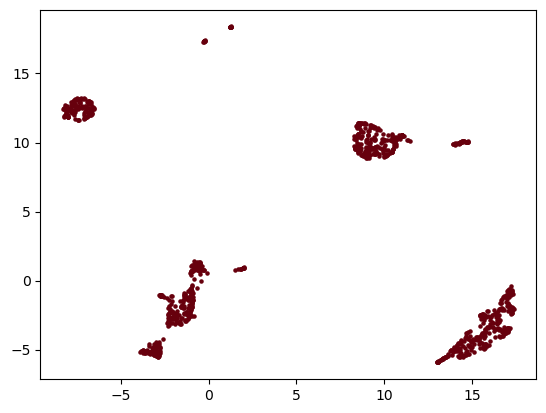

In [72]:
color_AF = cm.Reds(np.linspace(0, 1, 101))

AF_density = np.round(test1.AF_sorted[:SNP_no, :][order_SNP, :][0, :] * 100).astype(int)

for j in [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]:

    plt.scatter(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], s = 5, color = color_AF[j])
    plt.show()

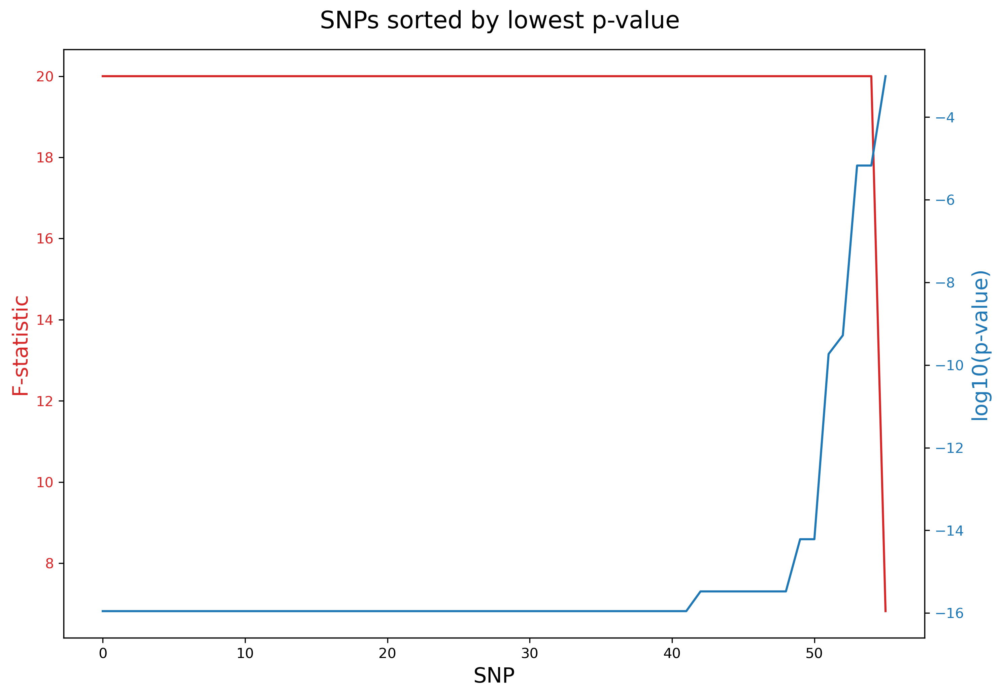

In [20]:
fig, ax1 = plt.subplots(dpi = 300)
fig.set_size_inches(10, 7)
fig.suptitle("SNPs sorted by lowest p-value", fontsize = 17)

ax1.set_xlabel('SNP', fontsize = 15)
ax1.set_ylabel('F-statistic', color = 'tab:red', fontsize = 15)
ax1.plot(np.arange(test1.SNP_total), test1.f_stat_ranked, color = 'tab:red')
ax1.tick_params(axis = 'y', labelcolor = 'tab:red')

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('log10(p-value)', color = 'tab:blue', fontsize = 15)
ax2.plot(np.arange(test1.SNP_total), np.log10(test1.p_value_ranked), color = 'tab:blue')
ax2.tick_params(axis = 'y', labelcolor = 'tab:blue')

fig.tight_layout()
plt.show()

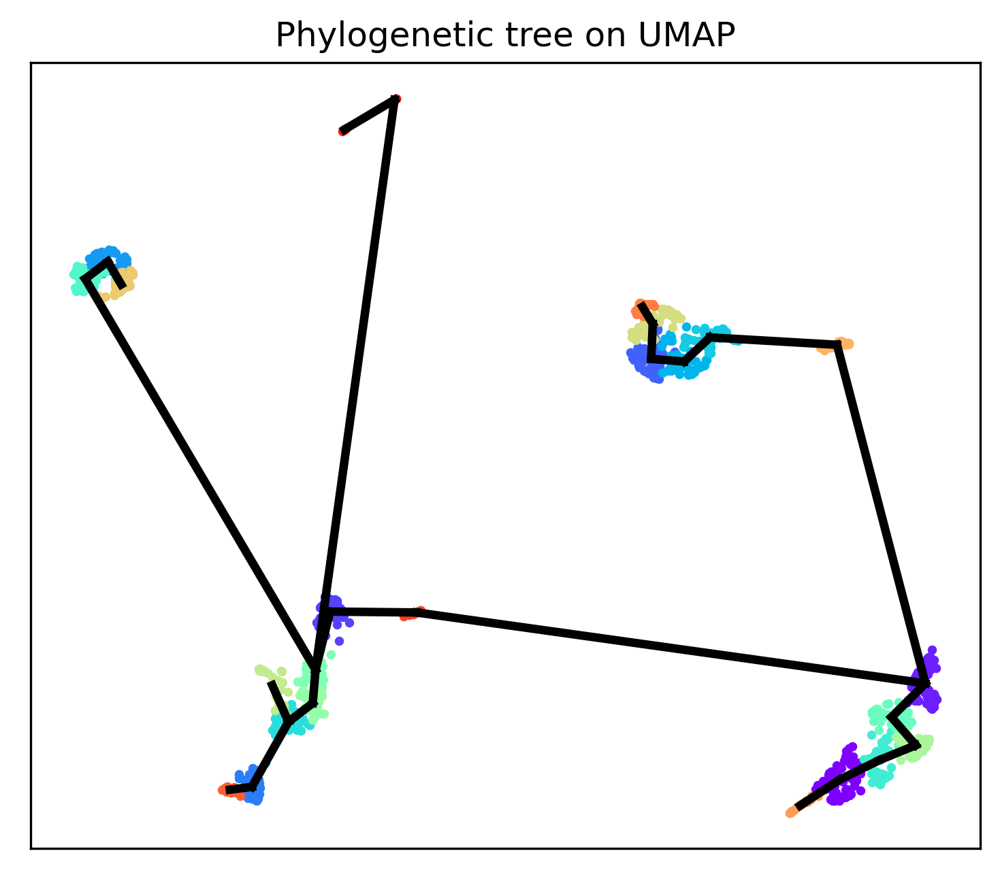

In [22]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Phylogenetic tree on UMAP")
axs.set_xticks([])
axs.set_yticks([])

for g in range(test1.cluster_no):

    axs.scatter(test1.embedding_2d[test1.clusters[g], 0], test1.embedding_2d[test1.clusters[g], 1], s = 5, color = test1.colors[g])

for g in range(len(test1.edge)):

    axs.plot([test1.centre_2d[test1.edge[g][0], 0], test1.centre_2d[test1.edge[g][1], 0]], [test1.centre_2d[test1.edge[g][0], 1], test1.centre_2d[test1.edge[g][1], 1]], linewidth = 3, color = "black")

plt.show()

Phylogenetic tree in latent space will be shown below.


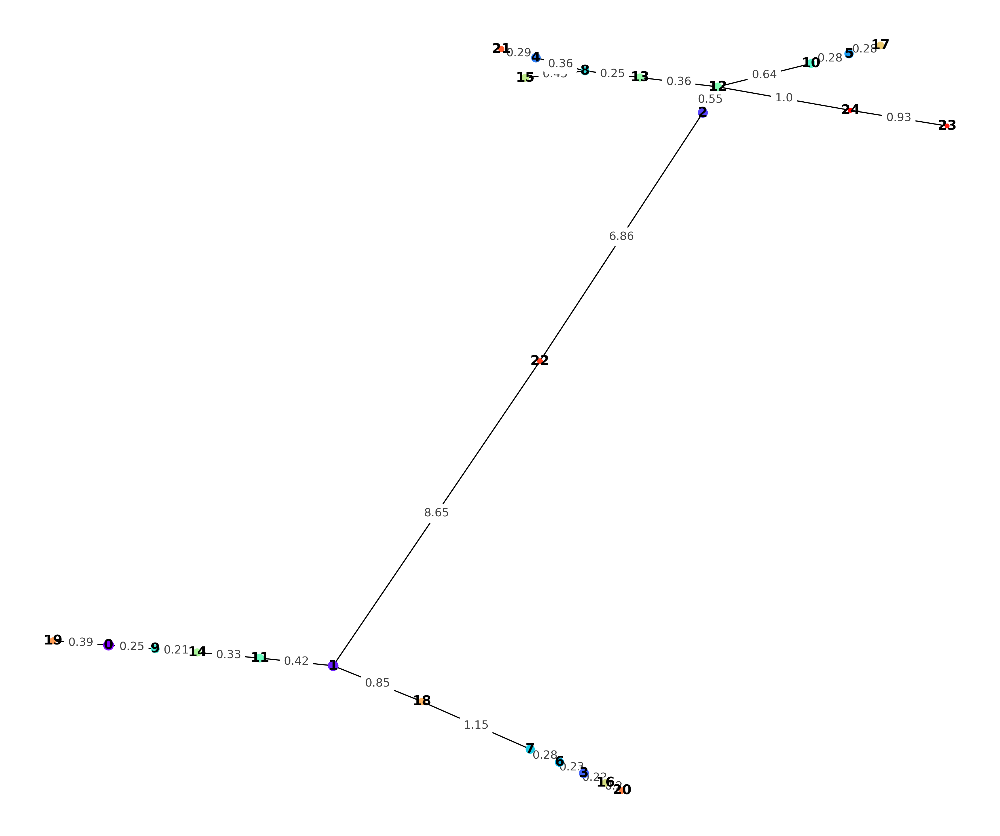

In [47]:
print(f"Phylogenetic tree in latent space will be shown below.")

graph = nx.Graph()

for u in range(len(test1.edge)):

    graph.add_edge(test1.edge[u][0], test1.edge[u][1], weight = test1.edge_weight[u], length = test1.edge_length_normalized[u])

pos = nx.spring_layout(graph, iterations = 3000, weight = 'weight')

plt.figure(figsize = (12, 10), dpi = 300) 
nx.draw(graph, pos, with_labels = True, font_weight = 'bold', node_size = test1.cluster_size[test1.connect_order], node_color = test1.colors[test1.connect_order])
nx.draw_networkx_edge_labels(graph, pos, nx.get_edge_attributes(graph, 'length'), rotate = False, alpha = 0.75)

plt.show()

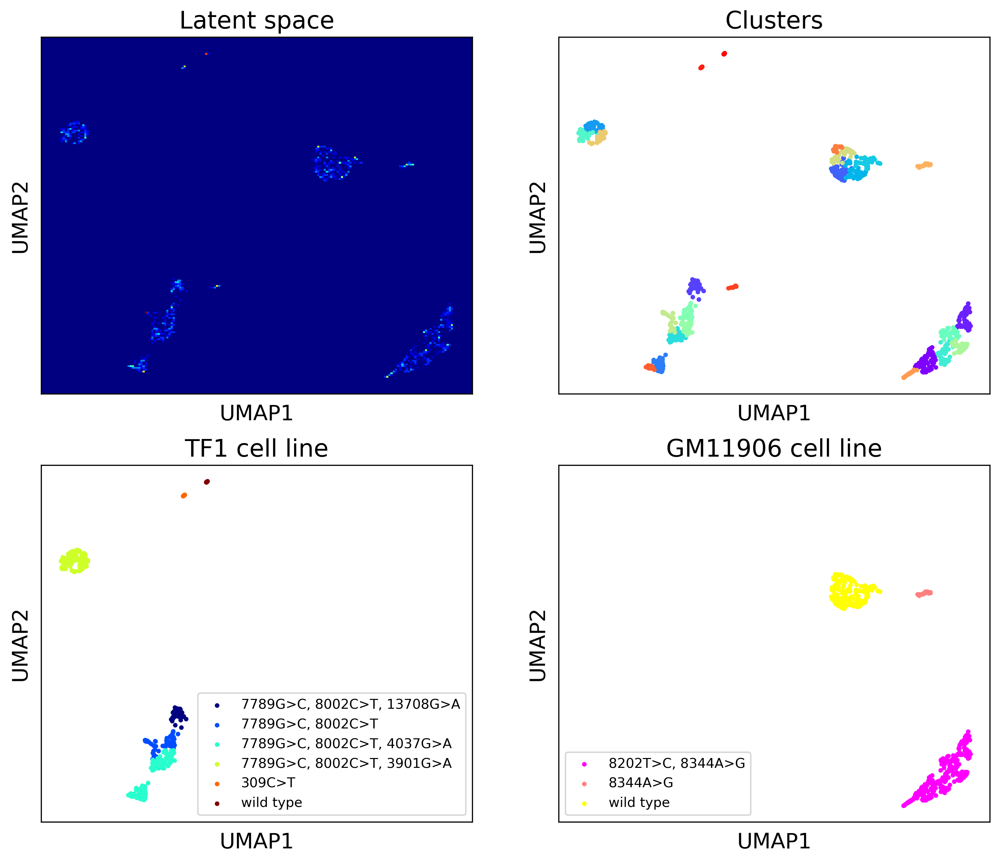

In [31]:
fig, axs = plt.subplots(2, 2, dpi = 300)
fig.set_size_inches(12, 10)

axs[0, 1].set_title("Clusters", fontsize = 17)

for w in range(25):
    
    axs[0, 1].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = test1.colors[w])
    
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_xlabel("UMAP1", fontsize = 15)
axs[0, 1].set_ylabel("UMAP2", fontsize = 15)

xlim0 = axs[0, 1].get_xlim()
ylim0 = axs[0, 1].get_ylim()

axs[0, 0].hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Latent space", fontsize = 17)
axs[0, 0].set_xlabel("UMAP1", fontsize = 15)
axs[0, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 0].set_title("TF1 cell line", fontsize = 17)

colors = cm.jet(np.linspace(0, 1, 6))

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[2], 0], test1.embedding_2d[test1.clusters[2], 1], s = 5, color = colors[0], label = '7789G>C, 8002C>T, 13708G>A')

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[12], 0], test1.embedding_2d[test1.clusters[12], 1], s = 5, color = colors[1], label = '7789G>C, 8002C>T')

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[15], 0], test1.embedding_2d[test1.clusters[15], 1], s = 5, color = colors[1])

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[4], 0], test1.embedding_2d[test1.clusters[4], 1], s = 5, color = colors[2], label = '7789G>C, 8002C>T, 4037G>A')

for w in [8, 13, 21]:
    
    axs[1, 0].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = colors[2])

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[10], 0], test1.embedding_2d[test1.clusters[10], 1], s = 5, color = colors[3], label = '7789G>C, 8002C>T, 3901G>A')

for w in [5, 17]:
    
    axs[1, 0].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = colors[3])

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[23], 0], test1.embedding_2d[test1.clusters[23], 1], s = 5, color = colors[4], label = '309C>T')

axs[1, 0].scatter(test1.embedding_2d[test1.clusters[24], 0], test1.embedding_2d[test1.clusters[24], 1], s = 5, color = colors[5], label = 'wild type')
    
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_xlim(test1.xlim_embedding_2d)
axs[1, 0].set_ylim(test1.ylim_embedding_2d)
axs[1, 0].set_xlabel("UMAP1", fontsize = 15)
axs[1, 0].set_ylabel("UMAP2", fontsize = 15)
axs[1, 0].legend(loc ="lower right", fontsize = "9.5")

axs[1, 1].set_title("GM11906 cell line", fontsize = 17)

colors = cm.spring(np.linspace(0, 1, 3))

axs[1, 1].scatter(test1.embedding_2d[test1.clusters[1], 0], test1.embedding_2d[test1.clusters[1], 1], s = 5, color = colors[0], label = '8202T>C, 8344A>G')

for w in [11, 14, 9, 0, 19]:
    
    axs[1, 1].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = colors[0])
    
axs[1, 1].scatter(test1.embedding_2d[test1.clusters[18], 0], test1.embedding_2d[test1.clusters[18], 1], s = 5, color = colors[1], label = '8344A>G')
    
axs[1, 1].scatter(test1.embedding_2d[test1.clusters[7], 0], test1.embedding_2d[test1.clusters[7], 1], s = 5, color = colors[2], label = 'wild type')
    
for w in [6, 3, 16, 20]:
    
    axs[1, 1].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = colors[2])
    
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_xlim(test1.xlim_embedding_2d)
axs[1, 1].set_ylim(test1.ylim_embedding_2d)
axs[1, 1].set_xlabel("UMAP1", fontsize = 15)
axs[1, 1].set_ylabel("UMAP2", fontsize = 15)
axs[1, 1].legend(loc ="lower left", fontsize = "9.5")

plt.show()

In [32]:
np.savetxt("assigned_label.csv", test1.assigned_label, delimiter=",")
np.savetxt("embedding_2d.csv", test1.embedding_2d, delimiter=",")
np.savetxt("cell_filter.csv", test1.cell_filter, delimiter=",")
np.savetxt("SNP_filter.csv", test1.SNP_filter, delimiter=",")
np.savetxt("embedding_3d.csv", test1.embedding_3d, delimiter=",")

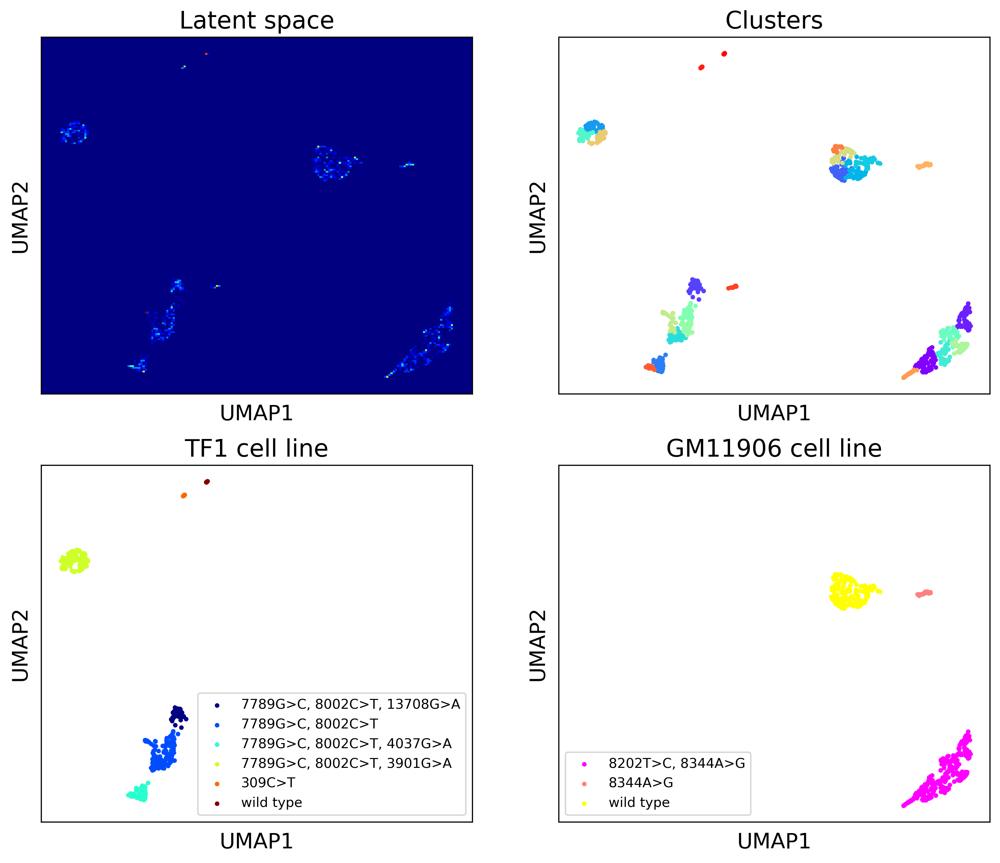

In [4]:
import numpy as np
import pandas as pd
import matplotlib.cm as cm 
import matplotlib.pyplot as plt

embedding_2d = np.genfromtxt("embedding_2d.csv", delimiter=",")
cell_filter = np.array(np.genfromtxt("cell_filter.csv", delimiter=","), dtype=bool)
assigned_label = np.genfromtxt("assigned_label.csv", delimiter=",")

clusters = []
    
for g in range(25):

    clusters.append(np.where(assigned_label == g)[0])
    
colors = cm.rainbow(np.linspace(0, 1, 25))
    
fig, axs = plt.subplots(2, 2, dpi = 300)
fig.set_size_inches(12, 10)

axs[0, 1].set_title("Clusters", fontsize = 17)

for w in range(25):
    
    axs[0, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[w])
    
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_xlabel("UMAP1", fontsize = 15)
axs[0, 1].set_ylabel("UMAP2", fontsize = 15)

xlim0 = axs[0, 1].get_xlim()
ylim0 = axs[0, 1].get_ylim()

axs[0, 0].hist2d(embedding_2d[:, 0], embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Latent space", fontsize = 17)
axs[0, 0].set_xlabel("UMAP1", fontsize = 15)
axs[0, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 0].set_title("TF1 cell line", fontsize = 17)

colors = cm.jet(np.linspace(0, 1, 6))

axs[1, 0].scatter(embedding_2d[clusters[2], 0], embedding_2d[clusters[2], 1], s = 5, color = colors[0], label = '7789G>C, 8002C>T, 13708G>A')

axs[1, 0].scatter(embedding_2d[clusters[12], 0], embedding_2d[clusters[12], 1], s = 5, color = colors[1], label = '7789G>C, 8002C>T')

axs[1, 0].scatter(embedding_2d[clusters[15], 0], embedding_2d[clusters[15], 1], s = 5, color = colors[1])
axs[1, 0].scatter(embedding_2d[clusters[8], 0], embedding_2d[clusters[8], 1], s = 5, color = colors[1])
axs[1, 0].scatter(embedding_2d[clusters[13], 0], embedding_2d[clusters[13], 1], s = 5, color = colors[1])

axs[1, 0].scatter(embedding_2d[clusters[4], 0], embedding_2d[clusters[4], 1], s = 5, color = colors[2], label = '7789G>C, 8002C>T, 4037G>A')

for w in [21]:
    
    axs[1, 0].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[2])

axs[1, 0].scatter(embedding_2d[clusters[10], 0], embedding_2d[clusters[10], 1], s = 5, color = colors[3], label = '7789G>C, 8002C>T, 3901G>A')

for w in [5, 17]:
    
    axs[1, 0].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[3])

axs[1, 0].scatter(embedding_2d[clusters[23], 0], embedding_2d[clusters[23], 1], s = 5, color = colors[4], label = '309C>T')

axs[1, 0].scatter(embedding_2d[clusters[24], 0], embedding_2d[clusters[24], 1], s = 5, color = colors[5], label = 'wild type')
    
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_xlim(xlim0)
axs[1, 0].set_ylim(ylim0)
axs[1, 0].set_xlabel("UMAP1", fontsize = 15)
axs[1, 0].set_ylabel("UMAP2", fontsize = 15)
axs[1, 0].legend(loc ="lower right", fontsize = "9.5")

axs[1, 1].set_title("GM11906 cell line", fontsize = 17)

colors = cm.spring(np.linspace(0, 1, 3))

axs[1, 1].scatter(embedding_2d[clusters[1], 0], embedding_2d[clusters[1], 1], s = 5, color = colors[0], label = '8202T>C, 8344A>G')

for w in [11, 14, 9, 0, 19]:
    
    axs[1, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[0])
    
axs[1, 1].scatter(embedding_2d[clusters[18], 0], embedding_2d[clusters[18], 1], s = 5, color = colors[1], label = '8344A>G')
    
axs[1, 1].scatter(embedding_2d[clusters[7], 0], embedding_2d[clusters[7], 1], s = 5, color = colors[2], label = 'wild type')
    
for w in [6, 3, 16, 20]:
    
    axs[1, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[2])
    
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_xlim(xlim0)
axs[1, 1].set_ylim(ylim0)
axs[1, 1].set_xlabel("UMAP1", fontsize = 15)
axs[1, 1].set_ylabel("UMAP2", fontsize = 15)
axs[1, 1].legend(loc ="lower left", fontsize = "9.5")

plt.show()

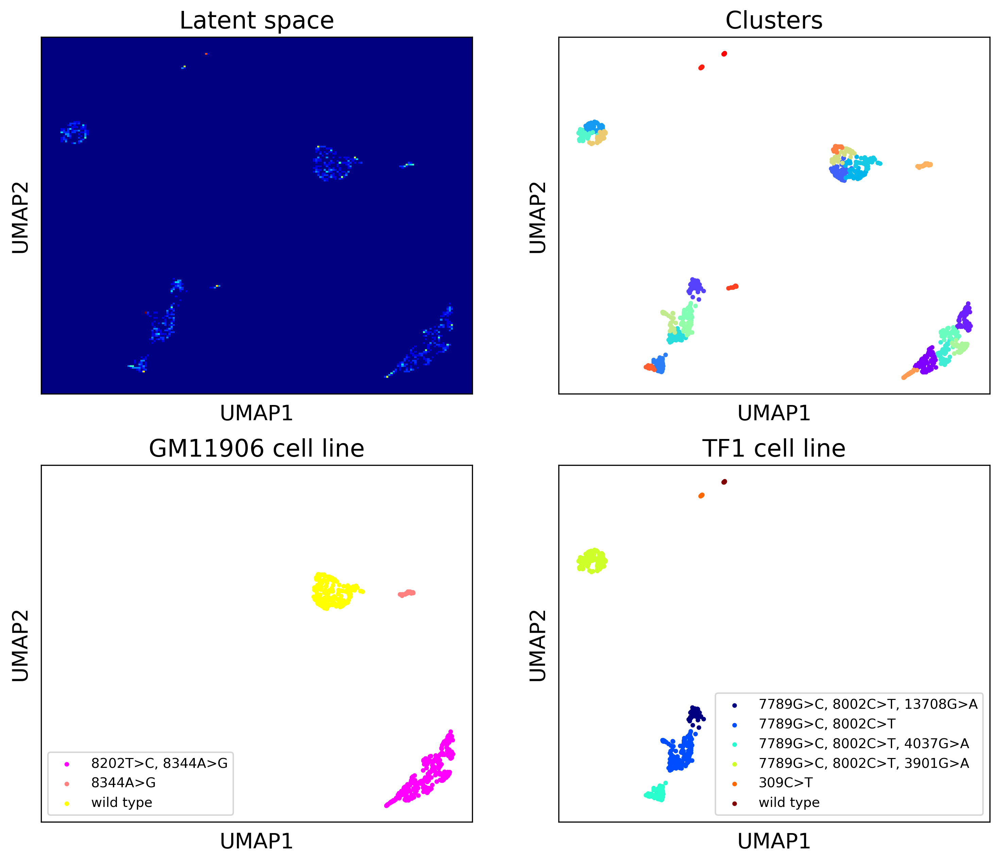

In [2]:
import numpy as np
import pandas as pd
import matplotlib.cm as cm 
import matplotlib.pyplot as plt

embedding_2d = np.genfromtxt("embedding_2d.csv", delimiter=",")
cell_filter = np.array(np.genfromtxt("cell_filter.csv", delimiter=","), dtype=bool)
assigned_label = np.genfromtxt("assigned_label.csv", delimiter=",")

clusters = []
    
for g in range(25):

    clusters.append(np.where(assigned_label == g)[0])
    
colors = cm.rainbow(np.linspace(0, 1, 25))
    
fig, axs = plt.subplots(2, 2, dpi = 300)
fig.set_size_inches(12, 10)

axs[0, 1].set_title("Clusters", fontsize = 17)

for w in range(25):
    
    axs[0, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[w])
    
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_xlabel("UMAP1", fontsize = 15)
axs[0, 1].set_ylabel("UMAP2", fontsize = 15)

xlim0 = axs[0, 1].get_xlim()
ylim0 = axs[0, 1].get_ylim()

axs[0, 0].hist2d(embedding_2d[:, 0], embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Latent space", fontsize = 17)
axs[0, 0].set_xlabel("UMAP1", fontsize = 15)
axs[0, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 1].set_title("TF1 cell line", fontsize = 17)

colors = cm.jet(np.linspace(0, 1, 6))

axs[1, 1].scatter(embedding_2d[clusters[2], 0], embedding_2d[clusters[2], 1], s = 5, color = colors[0], label = '7789G>C, 8002C>T, 13708G>A')

axs[1, 1].scatter(embedding_2d[clusters[12], 0], embedding_2d[clusters[12], 1], s = 5, color = colors[1], label = '7789G>C, 8002C>T')

axs[1, 1].scatter(embedding_2d[clusters[15], 0], embedding_2d[clusters[15], 1], s = 5, color = colors[1])
axs[1, 1].scatter(embedding_2d[clusters[8], 0], embedding_2d[clusters[8], 1], s = 5, color = colors[1])
axs[1, 1].scatter(embedding_2d[clusters[13], 0], embedding_2d[clusters[13], 1], s = 5, color = colors[1])

axs[1, 1].scatter(embedding_2d[clusters[4], 0], embedding_2d[clusters[4], 1], s = 5, color = colors[2], label = '7789G>C, 8002C>T, 4037G>A')

for w in [21]:
    
    axs[1, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[2])

axs[1, 1].scatter(embedding_2d[clusters[10], 0], embedding_2d[clusters[10], 1], s = 5, color = colors[3], label = '7789G>C, 8002C>T, 3901G>A')

for w in [5, 17]:
    
    axs[1, 1].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[3])

axs[1, 1].scatter(embedding_2d[clusters[23], 0], embedding_2d[clusters[23], 1], s = 5, color = colors[4], label = '309C>T')

axs[1, 1].scatter(embedding_2d[clusters[24], 0], embedding_2d[clusters[24], 1], s = 5, color = colors[5], label = 'wild type')
    
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_xlim(xlim0)
axs[1, 1].set_ylim(ylim0)
axs[1, 1].set_xlabel("UMAP1", fontsize = 15)
axs[1, 1].set_ylabel("UMAP2", fontsize = 15)
axs[1, 1].legend(loc ="lower right", fontsize = "9.5")

axs[1, 0].set_title("GM11906 cell line", fontsize = 17)

colors = cm.spring(np.linspace(0, 1, 3))

axs[1, 0].scatter(embedding_2d[clusters[1], 0], embedding_2d[clusters[1], 1], s = 5, color = colors[0], label = '8202T>C, 8344A>G')

for w in [11, 14, 9, 0, 19]:
    
    axs[1, 0].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[0])
    
axs[1, 0].scatter(embedding_2d[clusters[18], 0], embedding_2d[clusters[18], 1], s = 5, color = colors[1], label = '8344A>G')
    
axs[1, 0].scatter(embedding_2d[clusters[7], 0], embedding_2d[clusters[7], 1], s = 5, color = colors[2], label = 'wild type')
    
for w in [6, 3, 16, 20]:
    
    axs[1, 0].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[2])
    
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_xlim(xlim0)
axs[1, 0].set_ylim(ylim0)
axs[1, 0].set_xlabel("UMAP1", fontsize = 15)
axs[1, 0].set_ylabel("UMAP2", fontsize = 15)
axs[1, 0].legend(loc ="lower left", fontsize = "9.5")

plt.show()